## Faster GPUs

Users who have purchased one of Colab's paid plans have access to premium GPUs. You can upgrade your notebook's GPU settings in `Runtime > Change runtime type` in the menu to enable Premium accelerator. Subject to availability, selecting a premium GPU may grant you access to an L4 or A100 Nvidia GPU.

The free of charge version of Colab grants access to Nvidia's T4 GPUs subject to quota restrictions and availability.

You can see what GPU you've been assigned at any time by executing the following cell. If the execution result of running the code cell below is "Not connected to a GPU", you can change the runtime by going to `Runtime > Change runtime type` in the menu to enable a GPU accelerator, and then re-execute the code cell.

In [1]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

/bin/bash: line 1: nvidia-smi: command not found


## More memory

Users who have purchased one of Colab's paid plans have access to high-memory VMs when they are available.



You can see how much memory you have available at any time by running the following code cell. If the execution result of running the code cell below is "Not using a high-RAM runtime", then you can enable a high-RAM runtime via `Runtime > Change runtime type` in the menu. Then select High-RAM in the Runtime shape dropdown. After, re-execute the code cell.



In [2]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')


Your runtime has 359.2 gigabytes of available RAM

You are using a high-RAM runtime!


In [3]:
import scipy.cluster.hierarchy as hca
import pandas as pd
import numpy as np
from pylab import *
from matplotlib import pyplot
%matplotlib inline
np.set_printoptions(suppress=True)
from sklearn import cluster
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn import metrics
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import calinski_harabasz_score

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data Preparation

In [6]:
# Load the CSV file
data = pd.read_csv('/content/drive/MyDrive/HMPS-Socioeconomic_dataset/Second_submission /Journal of Engineering Management /Response_to_reviewers/Re-Data-interpolation-analysis/Final_datasets/Socio-hpms_interpolation_review.csv')
data.head(10)

,AADT_mean,IRI_mean,Year,Thickness_Rigid_mean,Thickness_Flexible_mean,Base_Thickness_mean,F_System_mode,Urban_Code_mode,Surface_Type_mode,County_Code_mode,State_Code_mode,RHU_AV,FRZ_IDX,FIPS_CODE,GEO_ID,FIPS_Code,County,Total Population,Male_x,Female_x,Median Age,Median Ages for Men,Median Ages for Women,Percentage_Male,Percentage_Female,Total Population among the Age 16 years and over,Employment Rate among the Age 16 and Over,Employment Rate among the Age 16-19,Employment Rate among the Age 20-24,Employment Rate among the Age 25-29,Employment Rate among the Age 30-34,Employment Rate among the Age 35-44,Employment Rate among the Age 45-54,Employment Rate among the Age 55-59,Employment Rate among the Age 60-64,Employment Rate among the Age 65-74,Employment Rate among the Age 75+,Unemployment Rate among the Age 16 and Over,Unemployment Rate among the Age 16-19,Unemployment Rate among the Age 20-24,Unemployment Rate among the Age 25-29,Unemployment Rate among the Age 30-34,Unemployment Rate among the Age 35-44,Unemployment Rate among the Age 45-54,Unemployment Rate among the Age 55-59,Unemployment Rate among the Age 60-64,Unemployment Rate among the Age 65-74,Unemployment Rate among the Age 75+,Total Households,Mean income Household (dollars),Total Population_RACE,White Alone,Black or African American Alone,American Indian and Alaska Native Alone,Asian Alone,Native Hawaiian and Other Pacific Islander Alone,Some Other Race Alone,White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population_x,Male_y,Female_y,Total civilian noninstitutionalized population with disability,Male with a disability,Female with a disability,People with a disability Age Under 5 Years,People with a disability Age 5 to 17 Years,People with a disability Age 18 to 34 Years,People with a disability Age 35 to 64 Years,People with a disability Age 65 to 74 years,People with a disability Age 75 years and over,Total Population Age 18-24,Age 18-24 with Bachelor's or Higher,Total Population with Age 25+,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Occupied housing units,"Occupied Housing Units with Household Income Less than $5,000","Occupied Housing Units with Household Income Less than $5,000 to $9,999","Occupied Housing Units with Household Income Less than $10,000 to $14,999","Occupied Housing Units with Household Income Less than $15,000 to $19,999","Occupied Housing Units with Household Income Less than $20,000 to $24,999","Occupied Housing Units with Household Income Less than $25,000 to $34,999","Occupied Housing Units with Household Income Less than $35,000 to $49,999","Occupied Housing Units with Household Income Less than $50,000 to $74,999","Occupied Housing Units with Household Income Less than $75,000 to $99,999","Occupied Housing Units with Household Income Less than $100,000 to $149,999","Occupied Housing Units with Household Income Less than $150,000 or more",Median household income (dollars),Total civilian noninstitutionalized population_y,Total Civilian Noninstitutionalized Male People,Total Civilian Noninstitutionalized Female People,Civilian Noninstitutionalized People with Disability,Civilian Noninstitutionalized People with No Disability,Totally Civilian Noninstitutionalized Health Insured People,Civilian Noninstitutionalized Health Insured Male,Civilian Noninstitutionalized Health Insured Female,Civilian Noninstitutionalized Health Insured Population with Disability,Civilian Noninstitutionalized Health Insured Population with No Disability,Percentage Civilian Noninstitutionalized Health Insured Population,Percentage Civilian Noninstitutionalized Health Insured Male,Percentage Civilian Noninstitutionalized Health Insured Female,Percentage Civilian Noninstitutionalized Health Insured People wit

In [7]:
list(data.columns)

['AADT_mean',
 'IRI_mean',
 'Year',
 'Thickness_Rigid_mean',
 'Thickness_Flexible_mean',
 'Base_Thickness_mean',
 'F_System_mode',
 'Urban_Code_mode',
 'Surface_Type_mode',
 'County_Code_mode',
 'State_Code_mode',
 'RHU_AV',
 'FRZ_IDX',
 'FIPS_CODE',
 'GEO_ID',
 'FIPS_Code',
 'County',
 'Total Population',
 'Male_x',
 'Female_x',
 'Median Age',
 'Median Ages for Men',
 'Median Ages for Women',
 'Percentage_Male',
 'Percentage_Female',
 'Total Population among the Age 16 years and over',
 'Employment Rate among the Age 16 and Over',
 'Employment Rate among the Age 16-19',
 'Employment Rate among the Age 20-24',
 'Employment Rate among the Age 25-29',
 'Employment Rate among the Age 30-34',
 'Employment Rate among the Age 35-44',
 'Employment Rate among the Age 45-54',
 'Employment Rate among the Age 55-59',
 'Employment Rate among the Age 60-64',
 'Employment Rate among the Age 65-74',
 'Employment Rate among the Age 75+',
 'Unemployment Rate among the Age 16 and Over',
 'Unemployment R

In [8]:
## dropping redunanant columns
data.drop([
 'GEO_ID',
 'County',
 'County_Code_mode',
 'State_Code_mode',
 'Total Population',
 'Male_x',
 'Female_x',
 'Median Ages for Men',
 'Median Ages for Women',
 'Total Population among the Age 16 years and over',
 'Employment Rate among the Age 16-19',
 'Employment Rate among the Age 20-24',
 'Employment Rate among the Age 25-29',
 'Employment Rate among the Age 30-34',
 'Employment Rate among the Age 35-44',
 'Employment Rate among the Age 45-54',
 'Employment Rate among the Age 55-59',
 'Employment Rate among the Age 60-64',
 'Employment Rate among the Age 65-74',
 'Employment Rate among the Age 75+',
 'Unemployment Rate among the Age 16-19',
 'Unemployment Rate among the Age 20-24',
 'Unemployment Rate among the Age 25-29',
 'Unemployment Rate among the Age 30-34',
 'Unemployment Rate among the Age 35-44',
 'Unemployment Rate among the Age 45-54',
 'Unemployment Rate among the Age 55-59',
 'Unemployment Rate among the Age 60-64',
 'Unemployment Rate among the Age 65-74',
 'Unemployment Rate among the Age 75+',
 'Total Households',
 'Total Population_RACE',
 'White Alone',
 'Black or African American Alone',
 'American Indian and Alaska Native Alone',
 'Asian Alone',
 'Native Hawaiian and Other Pacific Islander Alone',
 'Some Other Race Alone',
 'Male_y',
 'Female_y',
 'Total civilian noninstitutionalized population with disability',
 'Civilian Noninstitutionalized People with Disability',
 'Civilian Noninstitutionalized People with No Disability',
 'Male with a disability',
 'Female with a disability',
 'People with a disability Age Under 5 Years',
 'People with a disability Age 5 to 17 Years',
 'People with a disability Age 18 to 34 Years',
 'People with a disability Age 35 to 64 Years',
 'People with a disability Age 65 to 74 years',
 'People with a disability Age 75 years and over',
 'Total Population Age 18-24',
 'Total Population with Age 25+',
 'Occupied housing units',
 'Occupied Housing Units with Household Income Less than $5,000',
 'Occupied Housing Units with Household Income Less than $5,000 to $9,999',
 'Occupied Housing Units with Household Income Less than $10,000 to $14,999',
 'Occupied Housing Units with Household Income Less than $15,000 to $19,999',
 'Occupied Housing Units with Household Income Less than $20,000 to $24,999',
 'Occupied Housing Units with Household Income Less than $25,000 to $34,999',
 'Occupied Housing Units with Household Income Less than $35,000 to $49,999',
 'Occupied Housing Units with Household Income Less than $50,000 to $74,999',
 'Occupied Housing Units with Household Income Less than $75,000 to $99,999',
 'Occupied Housing Units with Household Income Less than $100,000 to $149,999',
 'Occupied Housing Units with Household Income Less than $150,000 or more',
 'Total civilian noninstitutionalized population_y',
 'Total Civilian Noninstitutionalized Male People',
 'Total Civilian Noninstitutionalized Female People',
 'Totally Civilian Noninstitutionalized Health Insured People',
 'Civilian Noninstitutionalized Health Insured Male',
 'Civilian Noninstitutionalized Health Insured Female',
 'Percentage Civilian Noninstitutionalized Health Insured Male',
 'Percentage Civilian Noninstitutionalized Health Insured Female',
 'Civilian Noninstitutionalized Uninsured People',
 'Civilian Noninstitutionalized Health Insured Population with Disability',
 'Civilian Noninstitutionalized Health Insured Population with No Disability',
 'Civilian Noninstitutionalized Uninsured People with Disability',
 'Civilian Noninstitutionalized Uninsured People with No Disability',
 'Percentage Civilian Noninstitutionalized Health Insured Population',
 'Percentage Civilian Noninstitutionalized Uninsured People',
 'Percentage Civilian Noninstitutionalized Uninsured Uninsured Male',
 'Percentage Civilian Noninstitutionalized Uninsured Uninsured Female',
 'Percentage Civilian Noninstitutionalized Health Insured People with Disability',
  'Percentage Civilian Noninstitutionalized Health Insured People with No Disability',
 'Total Population among the Age 5 years and over',
 'Speak a language other than English among the Age 5 years or over',
 'Speak Spanish other than English among the Age 5 years or over',
 'Speak Spanish other than English among the Age 5 years or over',
 'Speak Spanish other than English among the Age 5 to 17',
 'Speak Spanish other than English among the Age 18 to 64',
 'Speak Spanish other than English among the Age 65 years and over',
 'Speak Indo-European languages other than English among the Age 5 years or over',
 'Speak Indo-European languages other than English among the Age 5 to 17',
 'Speak Indo-European languages other than English among the Age 18 to 64',
 'Speak Indo-European languages other than English among the Age 65 years and over',
 'Percentage Speak Spanish other than English among the Age 5 years or over',
 'Percentage Speak Spanish other than English among the Age 5 to 17',
 'Percentage Speak Spanish other than English among the Age 18 to 64',
 'Percentage Speak Spanish other than English among the Age 65 years and over',
 'Percentage Speak Indo-European languages other than English among the Age 5 years or over',
 'Percentage Speak Indo-European languages other than English among the Age 5 to 17',
 'Percentage Speak Indo-European languages other than English among the Age 18 to 64',
 'Percentage Speak Indo-European languages other than English among the Age 65 years and over'], axis=1, inplace=True)

Here,
1. Urban Code Mode
2. AADT mean
3. IRI Mean  
4. RHU_AV
5. Precipitation
6. Mean Household income  
7. Median Age
8. Employment Rate on Population 16 years and over
9. Unemployment Rate on Population 16 years and over
10. White Alone
11. Black or African American alone
12. Asian alone
13. Some other race alone

In [9]:
data.columns

Index(['AADT_mean', 'IRI_mean', 'Year', 'Thickness_Rigid_mean',
       'Thickness_Flexible_mean', 'Base_Thickness_mean', 'F_System_mode',
       'Urban_Code_mode', 'Surface_Type_mode', 'RHU_AV', 'FRZ_IDX',
       'FIPS_CODE', 'FIPS_Code', 'Median Age', 'Percentage_Male',
       'Percentage_Female', 'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population_x',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with Bachelor's Degree', 'Median household income (dollars)',
       'Civilian Noninstitut

In [10]:
data.rename(columns = {'AADT_mean': 'AADT',
                            'IRI_mean': 'IRI',
                            'Thickness_Rigid_mean': 'Thickness of the Rigid Pavements',
                            'Thickness_Flexible_mean':'Thickness of the Flexible Pavements',
                            'Base_Thickness_mean': 'Thickness of the Base Pavements',
                            'F_System_mode': 'Functional System',
                            'Surface_Type_mode': 'Surface Type',
                            'RHU_AV': 'Relative Humidity',
                            'FRZ_IDX': 'Freezing Index',
                            'PRECIPITATION': 'Precipitation',
                            'EVAPORATION': 'Evaporation',
                            'Total civilian noninstitutionalized population_x': 'Total civilian noninstitutionalized population',
                            'Percentage_Male': 'Male (Percentage)',
                            'Percentage_Female': 'Female (Percentage)'}, inplace=True)

In [11]:
print('Functional System Unique Values:', list(data['Functional System'].unique()))
print('Surface Type  Unique Values:', list(data['Surface Type'].unique()))
print('Thickness of the Base Pavements Unique Values:', list(data['Thickness of the Base Pavements'].unique()))
print('Thickness of the Rigid Pavements  Unique Values:', list(data['Thickness of the Rigid Pavements'].unique()))
print('Thickness of the Flexible Pavements Unique Values:', list(data['Thickness of the Flexible Pavements'].unique()))

Functional System Unique Values: [1, 4, 5, 3, 2, 6]
Surface Type  Unique Values: [2, 7, 3, 6]
Thickness of the Base Pavements Unique Values: [21.8, 7.0, 23.9, 22.5, 20.8, 15.9, 14.3, 15.4, 34.0, 25.4, 16.7, 27.2, 31.2, 23.0, 25.6, 21.2, 14.7, 16.2, 18.0, 17.0, 23.1, 24.0, 24.1, 12.0, 23.5, 12.4, 13.0, 6.2, 18.1, 9.1, 18.4, 5.3, 11.0, 28.8, 22.0, 9.0, 12.2, 29.2, 3.0, 6.8, 20.5, 8.3, 16.0, 11.2, 30.0, 18.2, 19.6, 15.7, 37.4, 6.0, 36.8, 15.5, 14.0, 8.0, 13.8, 28.9, 24.5, 14.8, 21.0, 16.5, 27.9, 10.0, 4.0, 5.5, 11.6, 7.9, 2.0, 5.0, 20.0, 15.2, 25.0, 25.7, 26.0, 14.4, 17.7, 19.0, 12.6, 14.1, 27.0, 17.4, 9.8, 19.2, 18.8, 13.2, 19.9, 19.7, 9.3, 15.0, 18.7, 7.7, 21.3, 1.0, 17.1, 22.2, 26.2, 16.4, 19.1, 21.5, 15.8, 8.8, 32.0, 17.5, 20.2, 35.3, 37.0, 30.1, 30.4, 36.0, 9.2, 12.5, 14.5, 9.6, 28.0, 13.7, 6.3, 21.1, 27.7, 11.4, 9.5, 5.8, 13.6, 21.9, 18.5, 16.1, 28.1, 27.3, 18.6, 31.0, 17.6, 20.3, 11.1, 15.6, 26.5, 24.2, 8.6, 12.3, 22.1, 28.7, 29.9, 20.4, 20.6, 15.1, 4.3, 17.9, 12.8, 24.3, 11.5, 4.7

In [12]:
data.shape

(105064, 35)

In [13]:
data.columns

Index(['AADT', 'IRI', 'Year', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Surface Type', 'Relative Humidity',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with Bachelor's Degree', 'Media

In [14]:
data.dtypes

,0
AADT,float64
IRI,float64
Year,int64
Thickness of the Rigid Pavements,float64
Thickness of the Flexible Pavements,float64
Thickness of the Base Pavements,float64
Functional System,int64
Urban_Code_mode,float64
Surface Type,int64
Relative Humidity,float64


In [15]:
# Find and display the rows where the column contains string values
string_values = data[data['Median household income (dollars)'].apply(lambda x: isinstance(x, str))]

# Display the rows with string values
print(string_values[['Median household income (dollars)']])

Empty DataFrame
Columns: [Median household income (dollars)]
Index: []


In [16]:
# Convert the column to numeric, forcing errors to NaN
data['Median household income (dollars)'] = pd.to_numeric(data['Median household income (dollars)'], errors='coerce')

In [17]:
# Now the column is numeric, but any strings that couldn't be converted are replaced with NaN

data['Median household income (dollars)'] = data['Median household income (dollars)'].interpolate(method='linear')

In [18]:
data.isnull().sum()

,0
AADT,0
IRI,0
Year,0
Thickness of the Rigid Pavements,0
Thickness of the Flexible Pavements,0
Thickness of the Base Pavements,0
Functional System,0
Urban_Code_mode,0
Surface Type,0
Relative Humidity,0


## Check correlations between   features

Firslty we will check linear correlations then we will check non-linear correlations like square root and log relationsips. Based on the relations we could drop the columns

In [19]:
def calculate_corr(df, exclude_columns=None):
    # Set plot font preferences
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = 'Times New Roman'
    plt.rcParams['font.size'] = 30  # Adjusted font size for better readability

    # Select only numeric data from the DataFrame
    numeric_data = df.select_dtypes(include='number')

    # Exclude specified columns if any
    if exclude_columns is not None:
        numeric_data = numeric_data.drop(columns=exclude_columns, errors='ignore')

    # Compute the correlation matrix
    data_corr = numeric_data.corr(method='pearson').round(2)  # Round to two decimal places

    # Create a mask to display only the lower triangle
    mask = np.triu(np.ones_like(data_corr, dtype=bool))

    # Adjusting figure size based on the number of numeric features to ensure boxes are large enough
    plt.figure(figsize=(max(10, len(numeric_data.columns) * 2), max(8, len(numeric_data.columns) * 1.5)))

    # Plotting the heatmap with annotations and making sure the annot font size is adjusted properly
    sns.heatmap(data_corr, annot=True, linewidth=.5, cmap="RdYlGn", center=0, mask=mask, annot_kws={"size": 30})

    # Adjust layout to make more space if necessary
    plt.subplots_adjust(left=0.2, bottom=0.2)  # Adjust bottom margin if left margin adjustment is insufficient

    # Show the plot
    plt.show()

    return data_corr


In [20]:
#  Correlation on all data
data_corr = calculate_corr(data, exclude_columns=None)

Output hidden; open in https://colab.research.google.com to view.

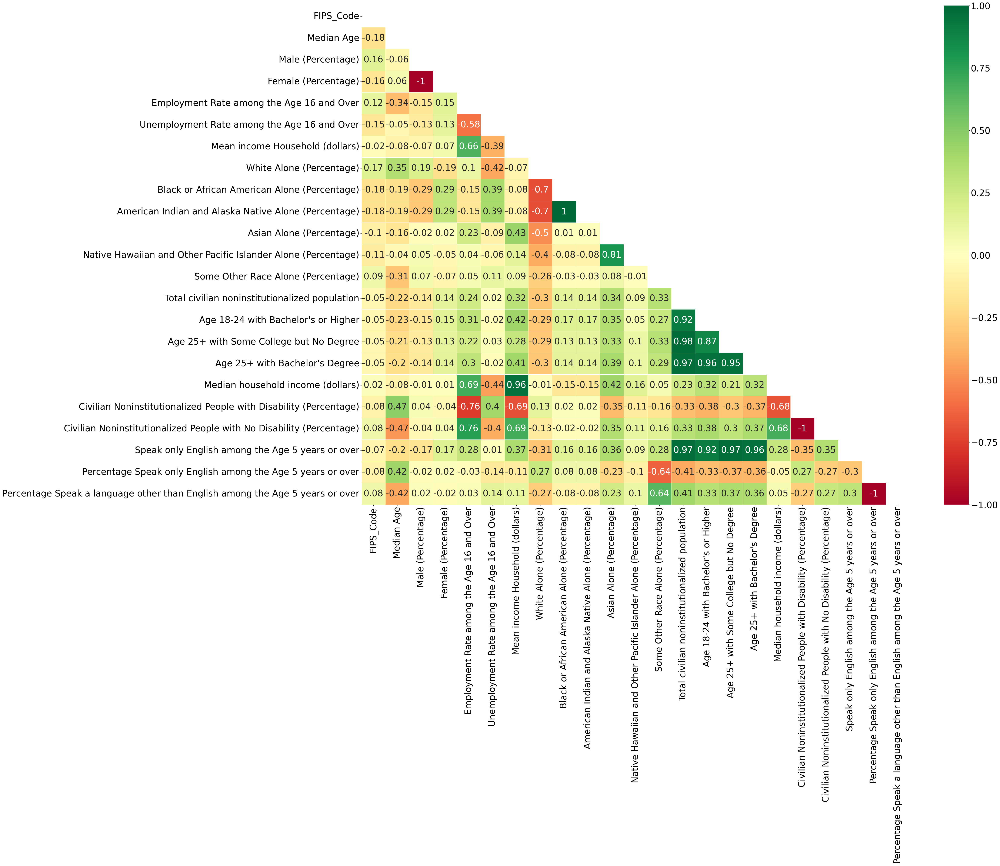

In [21]:
#  Correlation on ACS data
data_corr = calculate_corr(data, exclude_columns=['AADT', 'IRI', 'Year', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Surface Type', 'Relative Humidity',
       'Freezing Index', 'FIPS_CODE'])

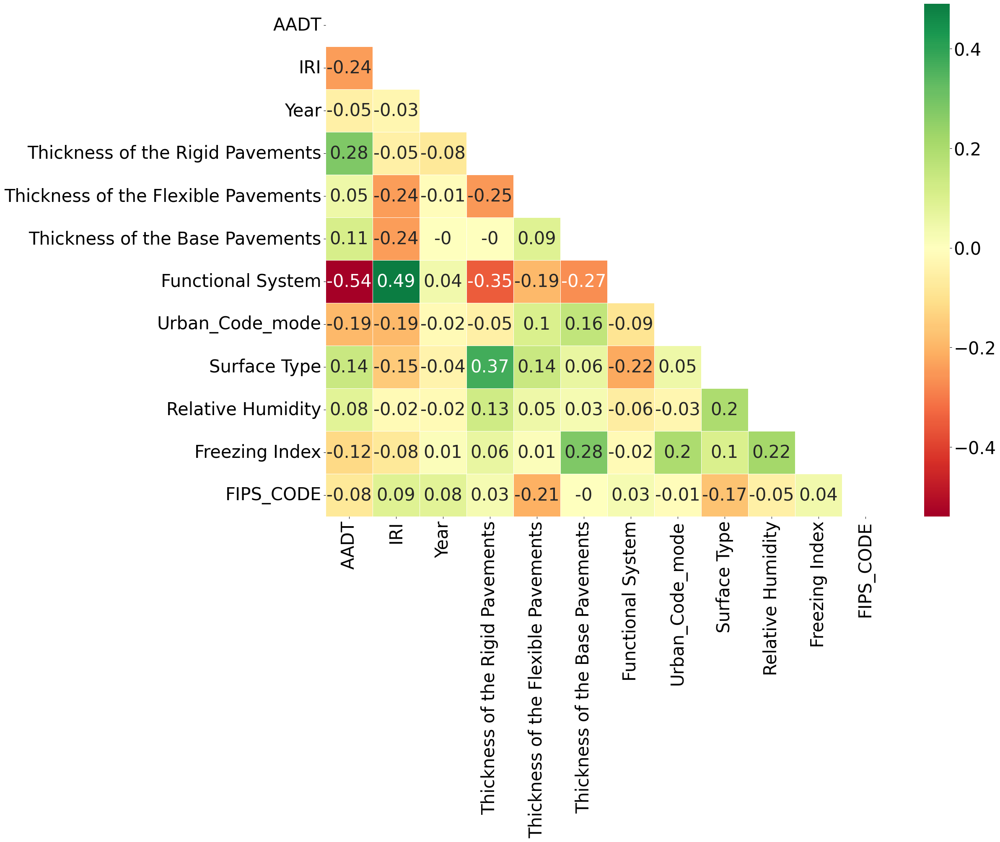

In [22]:
#  Correlation on HPMS & MEERA-2 data

data_corr = calculate_corr(data, exclude_columns=['FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       "Age 18-24 with Bachelor's or Higher",
       'Age 25+ with Some College but No Degree',
       "Age 25+ with Bachelor's Degree", 'Median household income (dollars)',
       'Civilian Noninstitutionalized People with Disability (Percentage)',
       'Civilian Noninstitutionalized People with No Disability (Percentage)',
       'Speak only English among the Age 5 years or over',
       'Speak a language other than English among the Age 5 years or over',
       'Percentage Speak only English among the Age 5 years or over',
       'Percentage Speak a language other than English among the Age 5 years or over'])

In [23]:
data.shape

(105064, 35)

In [24]:
data.columns

Index(['AADT', 'IRI', 'Year', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Surface Type', 'Relative Humidity',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with Bachelor's Degree', 'Media

In [25]:
data.dtypes

,0
AADT,float64
IRI,float64
Year,int64
Thickness of the Rigid Pavements,float64
Thickness of the Flexible Pavements,float64
Thickness of the Base Pavements,float64
Functional System,int64
Urban_Code_mode,float64
Surface Type,int64
Relative Humidity,float64


In [26]:
data.head(100)

,AADT,IRI,Year,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Surface Type,Relative Humidity,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over
0,17182.0,45.5,2017,0.0,11.4,21.8,1,99999.0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
1,2710.0,111.5,2017,0.0,7.5,7.0,4,99998.0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
2,394.0,106.1,2017,0.0,11.9,23.9,4,99999.0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
3,327.0,109.0,2017,0.0,9.0,22.5,4,99999.0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
4,1645.0,107.4,2017,0.0,6.4,20.8,5,99999.0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
5,2513.0,67.2,2017,0.0,6.2,15.9,3,99999.0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
6,3278.0,69.9,2017,0.0,4.3,14.3,3,99999.0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
7,3148.0,123.2,2017,0.0,7.1,15.4,3,99999.0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
8,19766.0,33.0,2017,0.0,11.2,34.0,1,99999.0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
9,19336.0,32.8,2017,0.0,11.0,34.0,1,99999.0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635


## Convert the urban codes to rual 0, small urban 1, urban 2

In [27]:
data['Urban_Code_mode'].unique()

array([99999., 99998., 81901., 29818.,  4549., 69184., 46747., 88732.,
       14401., 72112., 98020., 29494., 43345., 30925., 56116., 19801.,
       40213., 69454., 50392., 87193., 10162., 22096., 63217., 37243.,
       83926., 92485., 62407., 64135., 97291., 24580., 69076., 78364.,
       67294., 67105., 87787., 56602., 79606., 63838., 39758.,  8974.,
       68482., 67134., 84024., 80416., 86599., 80400., 65863., 48799.,
       13510., 64567., 45937., 71479., 31060., 45451., 98182., 46828.,
       96697., 23311., 13537., 75718., 15211., 16264., 22960., 22366.,
       13591., 24823., 43885.,  8407., 22717., 77770., 68509., 83899.,
       22204.,  6760., 41590., 95077., 77743., 48232., 43912., 53848.,
       88084.,  5680., 81739., 46531., 62677., 46045., 40375.,  1279.,
       82468., 36514., 49339., 71263.,  4951., 71506., 24607., 21745.,
        4843., 92242.,   199., 49594., 94294., 91261., 31519., 36190.,
       39430., 56980.,  5869.,  7138., 83116., 47719., 29872., 42157.,
      

In [28]:
# Define the function to transform values to categories
def label_category(code):
    if code == 99999:
        return 'rural'
    elif code == 99998:
        return 'small urban'
    else:
        return 'urban'

# Apply the transformation and insert the new column next to 'Urban_Code_mode'
data.insert(data.columns.get_loc('Urban_Code_mode') + 1, 'Urban Code', data['Urban_Code_mode'].apply(label_category))

# Display the updated DataFrame to check if the transformation is applied as expected
data.head(10)

,AADT,IRI,Year,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Urban Code,Surface Type,Relative Humidity,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over
0,17182.0,45.5,2017,0.0,11.4,21.8,1,99999.0,rural,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
1,2710.0,111.5,2017,0.0,7.5,7.0,4,99998.0,small urban,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
2,394.0,106.1,2017,0.0,11.9,23.9,4,99999.0,rural,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
3,327.0,109.0,2017,0.0,9.0,22.5,4,99999.0,rural,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
4,1645.0,107.4,2017,0.0,6.4,20.8,5,99999.0,rural,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
5,2513.0,67.2,2017,0.0,6.2,15.9,3,99999.0,rural,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
6,3278.0,69.9,2017,0.0,4.3,14.3,3,99999.0,rural,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
7,3148.0,123.2,2017,0.0,7.1,15.4,3,99999.0,rural,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
8,19766.0,33.0,2017,0.0,11.2,34.0,1,99999.0,rural,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
9,19336.0,32.8,2017,0.0,11.0,34.0,1,99999.0,rural,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635


In [29]:
# Filter rows where 'Urban_Code_mode' is 'rural'
rural_rows = data[data['Urban Code'] == 'rural']

# Display the filtered DataFrame
rural_rows.count()

,0
AADT,37772
IRI,37772
Year,37772
Thickness of the Rigid Pavements,37772
Thickness of the Flexible Pavements,37772
Thickness of the Base Pavements,37772
Functional System,37772
Urban_Code_mode,37772
Urban Code,37772
Surface Type,37772


## urban_code_mode Label encoidng

You can use label encoding for converting the categoricals to numeric
reference: https://www.analyticsvidhya.com/blog/2023/07/label-encoding-in-python/?fbclid=IwAR3M75qn-5xxJvo4g9HHWBx6BBHCfqXrVmH6G_wtPL4Kt6cvdADc6GLp8YA

In [30]:
from sklearn.preprocessing import LabelEncoder

# Create a label encoder object
le = LabelEncoder()

## Assign numerical values and sorting in another column

data['Urban_Code_mode_encoded'] = le.fit_transform(data['Urban Code'])

# First, let's list all current columns to understand their order
current_columns = data.columns.tolist()

# Define the desired position for 'Urban_Code_mode_encoded' - right after 'Urban_Code_mode'
# Find the index of 'Urban_Code_mode' and add 1 to get the desired position for 'Urban_Code_mode_encoded'
urban_code_mode_index = current_columns.index('Urban Code') + 1

# Now, let's remove 'Urban_Code_mode_encoded' from its current position and insert it at the desired position
current_columns.remove('Urban_Code_mode_encoded')  # Remove the encoded column from its current position
current_columns.insert(urban_code_mode_index, 'Urban_Code_mode_encoded')  # Insert it right after 'Urban_Code_mode'

# Reorder the DataFrame columns based on the updated list
data = data[current_columns]

# Display the DataFrame to verify the new column order
data.head(10)

,AADT,IRI,Year,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Urban Code,Urban_Code_mode_encoded,Surface Type,Relative Humidity,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over
0,17182.0,45.5,2017,0.0,11.4,21.8,1,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
1,2710.0,111.5,2017,0.0,7.5,7.0,4,99998.0,small urban,1,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
2,394.0,106.1,2017,0.0,11.9,23.9,4,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
3,327.0,109.0,2017,0.0,9.0,22.5,4,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
4,1645.0,107.4,2017,0.0,6.4,20.8,5,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
5,2513.0,67.2,2017,0.0,6.2,15.9,3,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
6,3278.0,69.9,2017,0.0,4.3,14.3,3,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
7,3148.0,123.2,2017,0.0,7.1,15.4,3,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
8,19766.0,33.0,2017,0.0,11.2,34.0,1,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
9,19336.0,32.8,2017,0.0,11.0,34.0,1,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635


In [31]:
# Filter rows where 'Urban_Code_mode' is 'rural'
small_urban_rows = data[data['Urban_Code_mode_encoded'] == 1]

# Display the filtered DataFrame
small_urban_rows.head(10)

,AADT,IRI,Year,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Urban Code,Urban_Code_mode_encoded,Surface Type,Relative Humidity,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over
1,2710.0,111.5,2017,0.0,7.5,7.0,4,99998.0,small urban,1,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
20,688.0,49.1,2017,0.0,5.5,18.0,3,99998.0,small urban,1,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
21,1545.0,99.0,2017,0.0,5.5,18.0,3,99998.0,small urban,1,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
22,6251.0,82.0,2017,0.0,9.0,17.0,3,99998.0,small urban,1,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
23,3296.0,83.0,2017,0.0,9.0,17.0,3,99998.0,small urban,1,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
24,3296.0,46.9,2017,0.0,10.8,23.1,3,99998.0,small urban,1,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.784280,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
44,7739.0,148.0,2017,0.0,5.2,12.2,4,99998.0,small urban,1,2,41.7,1.6,4003,4003.0,40.5,50.660786,49.339214,42.8,7.6,61398.0,84.401973,3.782921,3.782921,1.816371,0.400740,3.827184,115099,499,25461,12916,47847.0,16.795976,83.204024,83714,70.493625,29.506375
47,5607.0,108.0,2017,0.0,5.0,13.0,4,99998.0,small urban,1,2,41.7,1.6,4003,4003.0,40.5,50.660786,49.339214,42.8,7.6,61398.0,84.401973,3.782921,3.782921,1.816371,0.400740,3.827184,115099,499,25461,12916,47847.0,16.795976,83.204024,83714,70.493625,29.506375
48,7739.0,74.5,2017,0.0,5.0,13.0,4,99998.0,small urban,1,2,41.7,1.6,4003,4003.0,40.5,50.660786,49.339214,42.8,7.6,61398.0,84.401973,3.782921,3.782921,1.816371,0.400740,3.827184,115099,499,25461,12916,47847.0,16.795976,83.204024,83714,70.493625,29.506375
59,7361.0,135.0,2017,0.0,5.2,19.6,3,99998.0,small urban,1,2,41.7,1.6,4003,4003.0,40.5,50.660786,49.339214,42.8,7.6,61398.0,84.401973,3.782921,3.782921,1.816371,0.400740,3.827184,115099,499,25461,12916,47847.0,16.795976,83.204024,83714,70.493625,29.506375


In [32]:
small_urban_rows.count()

,0
AADT,14542
IRI,14542
Year,14542
Thickness of the Rigid Pavements,14542
Thickness of the Flexible Pavements,14542
Thickness of the Base Pavements,14542
Functional System,14542
Urban_Code_mode,14542
Urban Code,14542
Urban_Code_mode_encoded,14542


In [33]:
# Filter rows where 'Urban_Code_mode' is 'rural'
rurual_rows = data[data['Urban_Code_mode_encoded'] == 0]

# Display the filtered DataFrame
rurual_rows.head(10)

,AADT,IRI,Year,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Urban Code,Urban_Code_mode_encoded,Surface Type,Relative Humidity,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over
0,17182.0,45.5,2017,0.0,11.4,21.8,1,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
2,394.0,106.1,2017,0.0,11.9,23.9,4,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
3,327.0,109.0,2017,0.0,9.0,22.5,4,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
4,1645.0,107.4,2017,0.0,6.4,20.8,5,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
5,2513.0,67.2,2017,0.0,6.2,15.9,3,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
6,3278.0,69.9,2017,0.0,4.3,14.3,3,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
7,3148.0,123.2,2017,0.0,7.1,15.4,3,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
8,19766.0,33.0,2017,0.0,11.2,34.0,1,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
9,19336.0,32.8,2017,0.0,11.0,34.0,1,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
10,18265.0,42.7,2017,0.0,13.0,25.4,1,99999.0,rural,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635


In [34]:
rurual_rows.count()

,0
AADT,37772
IRI,37772
Year,37772
Thickness of the Rigid Pavements,37772
Thickness of the Flexible Pavements,37772
Thickness of the Base Pavements,37772
Functional System,37772
Urban_Code_mode,37772
Urban Code,37772
Urban_Code_mode_encoded,37772


In [35]:
data.drop(['Urban Code'], axis=1, inplace=True)

In [36]:
data.columns

Index(['AADT', 'IRI', 'Year', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Urban_Code_mode_encoded', 'Surface Type',
       'Relative Humidity', 'Freezing Index', 'FIPS_CODE', 'FIPS_Code',
       'Median Age', 'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [37]:
data.head(10)

,AADT,IRI,Year,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Urban_Code_mode_encoded,Surface Type,Relative Humidity,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over
0,17182.0,45.5,2017,0.0,11.4,21.8,1,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
1,2710.0,111.5,2017,0.0,7.5,7.0,4,99998.0,1,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
2,394.0,106.1,2017,0.0,11.9,23.9,4,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
3,327.0,109.0,2017,0.0,9.0,22.5,4,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
4,1645.0,107.4,2017,0.0,6.4,20.8,5,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
5,2513.0,67.2,2017,0.0,6.2,15.9,3,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
6,3278.0,69.9,2017,0.0,4.3,14.3,3,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
7,3148.0,123.2,2017,0.0,7.1,15.4,3,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
8,19766.0,33.0,2017,0.0,11.2,34.0,1,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635
9,19336.0,32.8,2017,0.0,11.0,34.0,1,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635


In [38]:
data.columns

Index(['AADT', 'IRI', 'Year', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Urban_Code_mode_encoded', 'Surface Type',
       'Relative Humidity', 'Freezing Index', 'FIPS_CODE', 'FIPS_Code',
       'Median Age', 'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [39]:
data.dtypes

,0
AADT,float64
IRI,float64
Year,int64
Thickness of the Rigid Pavements,float64
Thickness of the Flexible Pavements,float64
Thickness of the Base Pavements,float64
Functional System,int64
Urban_Code_mode,float64
Urban_Code_mode_encoded,int64
Surface Type,int64


In [40]:
data.shape

(105064, 36)

In [41]:
data.isnull().sum()

,0
AADT,0
IRI,0
Year,0
Thickness of the Rigid Pavements,0
Thickness of the Flexible Pavements,0
Thickness of the Base Pavements,0
Functional System,0
Urban_Code_mode,0
Urban_Code_mode_encoded,0
Surface Type,0


In [42]:
unique_fips_ = data['FIPS_CODE'].unique()
len(unique_fips_)

2622

In [43]:
# Check for mixed types in columns
for col in data.columns:
    unique_types = data[col].apply(type).nunique()
    if unique_types > 1:
        print(f"Column '{col}' has mixed types: {data[col].apply(type).unique()}")


In [44]:
# Check for any null values in the DataFrame
data.isnull().sum()

,0
AADT,0
IRI,0
Year,0
Thickness of the Rigid Pavements,0
Thickness of the Flexible Pavements,0
Thickness of the Base Pavements,0
Functional System,0
Urban_Code_mode,0
Urban_Code_mode_encoded,0
Surface Type,0


In [45]:
data.shape

(105064, 36)

In [46]:
data.dtypes

,0
AADT,float64
IRI,float64
Year,int64
Thickness of the Rigid Pavements,float64
Thickness of the Flexible Pavements,float64
Thickness of the Base Pavements,float64
Functional System,int64
Urban_Code_mode,float64
Urban_Code_mode_encoded,int64
Surface Type,int64


## Filter dataset year by Year

We need to sort by years, instead we need IRI values of

In [47]:
df_2017 = data[data['Year'] == 2017]
df_2018 = data[data['Year'] == 2018]
df_2019 = data[data['Year'] == 2019]
df_2020 = data[data['Year'] == 2020]

print(df_2017.shape)
print(df_2018.shape)
print(df_2019.shape)
print(df_2020.shape)

(23549, 36)
(15653, 36)
(32317, 36)
(33545, 36)


### Step 2: Pre-clustering using K-Means

Understand KMeans Clustering from here:
https://github.com/alexandrehsd/Cluster-Analysis/blob/master/Cluster%20Analysis.ipynb

See this vidoe for better understanding: https://www.youtube.com/watch?v=4b5d3muPQmA

 The K-means algorithm performs the following steps:

1. Choose the number (K) of clusters
2. Specify the cluster seeds (Define the initial position of the centroids)
Here, you can create a range of cluster numbers and use loop to find the best answers.
3. Assign each point to a centroid based on its proximity (if the centroid
 is the nearest centroid to the point, then assign to , do this for all points)
4. Adjust the centroid (recalculate the position of each centroid based in the points assigned to them)
5. Repeat step 3 and 4, until achieving a stop criterion
6. After achieve a stop criteria, end execution.

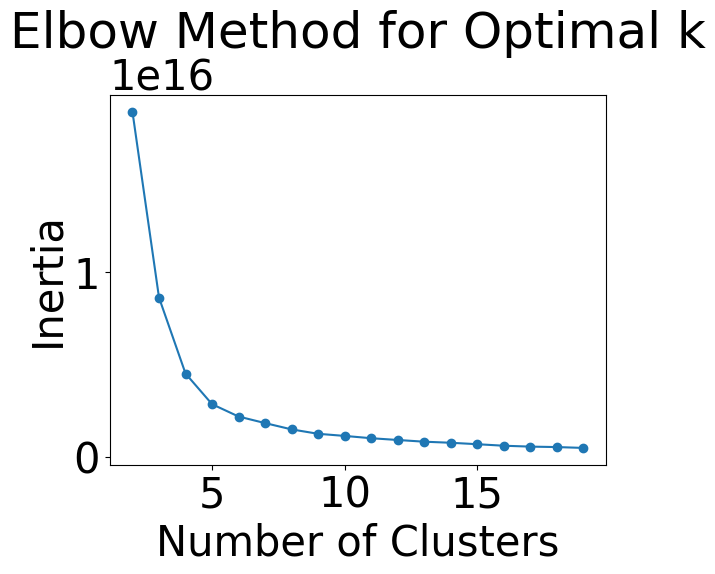

In [48]:
# Continue with your KMeans clustering
inertia = []
for n_clusters in range(2, 20):
    kmeans_model = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)
    kmeans_model.fit(data)
    inertia.append(kmeans_model.inertia_)

# Plotting the elbow curve
import matplotlib.pyplot as plt

plt.plot(range(2, 20), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

## The KElbow visulaizer cannot select only numeric columns

In [49]:
pip install yellowbrick

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 282.6/282.6 kB 5.0 MB/s eta 0:00:00


In [50]:
## source: https://towardsdatascience.com/cheat-sheet-to-implementing-7-methods-for-selecting-optimal-number-of-clusters-in-python-898241e1d6ad

# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer

# Select only the numeric columns for clustering
numeric_data = data.select_dtypes(include=[np.number])

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

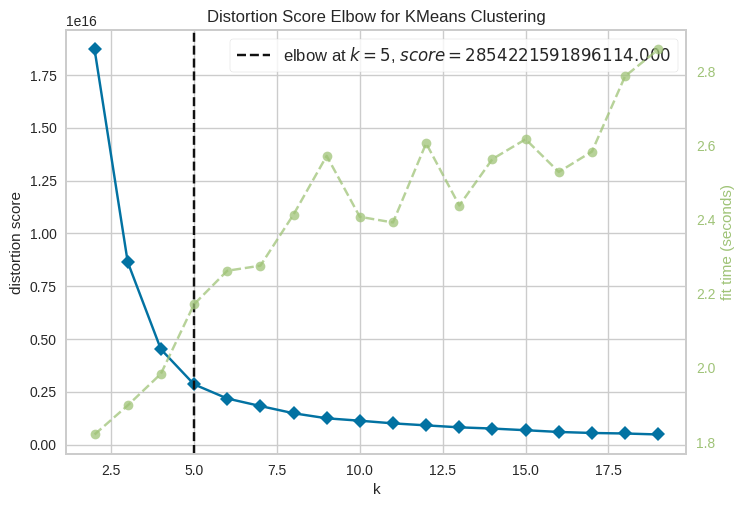

In [51]:
model = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,20), timings= True)
visualizer.fit(numeric_data)        # Fit data to visualizer
visualizer.show(outpath="elbow_visualization.png")

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

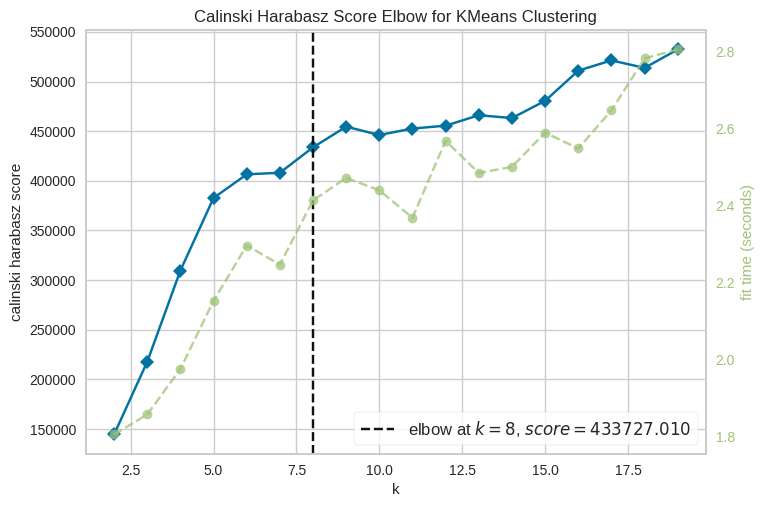

In [52]:
##  check optimal clusters for calinski_harabasz
## source: https://towardsdatascience.com/cheat-sheet-to-implementing-7-methods-for-selecting-optimal-number-of-clusters-in-python-898241e1d6ad

from yellowbrick.cluster import KElbowVisualizer
model = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)

# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,20), metric='calinski_harabasz', timings= True)
visualizer.fit(numeric_data)    # Fit the data to the visualizer
visualizer.show(outpath="calinski_harabasz_visualization.png")

### Calculate the Silhoutte Score

In [53]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Initialize a list to store the average silhouette scores
silhouette_scores = []

# Iterate over the range of desired cluster numbers
for n_clusters in range(2, 20):   # Iterate over the range of desired cluster numbers from 2, 20

    # Create a KMeans instance with n_clusters
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)

    # Fit the model and predict cluster labels
    cluster_labels = kmeans.fit_predict(data)

    # Calculate the silhouette score
    silhouette_avg = silhouette_score(data, cluster_labels)
    silhouette_avg = f"{silhouette_avg:.2f}"  # This will format the score to have two decimal places

    # Print and store the average silhouette score
    print(f"The average silhouette score for {n_clusters} clusters: {silhouette_avg}")
    silhouette_scores.append(silhouette_avg)

# Find the number of clusters with the highest silhouette score
best_index = silhouette_scores.index(max(silhouette_scores))
best_n_clusters = range(2, 20)[best_index]
print(f"Best number of clusters within range 2-20: {best_n_clusters} with a silhouette score of {silhouette_scores[best_index]}")


The average silhouette score for 2 clusters: 0.83
The average silhouette score for 3 clusters: 0.75
The average silhouette score for 4 clusters: 0.69
The average silhouette score for 5 clusters: 0.61
The average silhouette score for 6 clusters: 0.53
The average silhouette score for 7 clusters: 0.53
The average silhouette score for 8 clusters: 0.53
The average silhouette score for 9 clusters: 0.48
The average silhouette score for 10 clusters: 0.49
The average silhouette score for 11 clusters: 0.46
The average silhouette score for 12 clusters: 0.49
The average silhouette score for 13 clusters: 0.49
The average silhouette score for 14 clusters: 0.46
The average silhouette score for 15 clusters: 0.41
The average silhouette score for 16 clusters: 0.41
The average silhouette score for 17 clusters: 0.41
The average silhouette score for 18 clusters: 0.34
The average silhouette score for 19 clusters: 0.40
Best number of clusters within range 2-20: 2 with a silhouette score of 0.83


### Calculate the boudlin score

In [54]:
from sklearn.metrics import davies_bouldin_score

# Initialize a list to store the Davies-Bouldin scores
davies_bouldin_scores = []

# Assuming 'data' is your dataset
# Iterate over the range of desired cluster numbers
for n_clusters in range(2, 20):  # # Iterate over the range of desired cluster numbers from 2, 20

    # Create a KMeans instance with n_clusters
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)

    # Fit the model and predict the cluster labels
    cluster_labels = kmeans.fit_predict(data)

    # Calculate the Davies-Bouldin score
    score = davies_bouldin_score(data, cluster_labels)
    score = f"{score:.2f}"  # This will format the score to have two decimal places

    # Print and store the Davies-Bouldin score
    print(f"The Davies-Bouldin score for {n_clusters} clusters: {score}")
    davies_bouldin_scores.append(score)

# Find the number of clusters with the lowest Davies-Bouldin score
best_index = davies_bouldin_scores.index(min(davies_bouldin_scores))
best_n_clusters = range(2, 20)[best_index]
print(f"Best number of clusters within range 2-20: {best_n_clusters} with a Davies-Bouldin score of {davies_bouldin_scores[best_index]}")


The Davies-Bouldin score for 2 clusters: 0.52
The Davies-Bouldin score for 3 clusters: 0.45
The Davies-Bouldin score for 4 clusters: 0.49
The Davies-Bouldin score for 5 clusters: 0.50
The Davies-Bouldin score for 6 clusters: 0.56
The Davies-Bouldin score for 7 clusters: 0.57
The Davies-Bouldin score for 8 clusters: 0.51
The Davies-Bouldin score for 9 clusters: 0.56
The Davies-Bouldin score for 10 clusters: 0.53
The Davies-Bouldin score for 11 clusters: 0.73
The Davies-Bouldin score for 12 clusters: 0.51
The Davies-Bouldin score for 13 clusters: 0.52
The Davies-Bouldin score for 14 clusters: 0.69
The Davies-Bouldin score for 15 clusters: 0.57
The Davies-Bouldin score for 16 clusters: 0.60
The Davies-Bouldin score for 17 clusters: 0.57
The Davies-Bouldin score for 18 clusters: 0.65
The Davies-Bouldin score for 19 clusters: 0.63
Best number of clusters within range 2-20: 3 with a Davies-Bouldin score of 0.45


### guide source: https://www.kaggle.com/code/dhanyajothimani/basic-visualization-and-clustering-in-python


In [55]:
# Applying K-Means with the optimal number of clusters
kmeans = KMeans(n_clusters=10, init='k-means++',
                          max_iter=300, n_init=10, random_state=42)

cluster_labels = kmeans.fit_predict(data)

In [56]:
cluster_labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [57]:
kmeans.n_features_in_

36

In [58]:
kmeans.feature_names_in_

array(['AADT', 'IRI', 'Year', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Urban_Code_mode_encoded', 'Surface Type',
       'Relative Humidity', 'Freezing Index', 'FIPS_CODE', 'FIPS_Code',
       'Median Age', 'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       "Age 18-24 with Bachelor's or Higher",
       'Age 25+ with Some College but No Degree',
       "Age 25+ with

In [59]:
kmeans.get_params

<bound method BaseEstimator.get_params of KMeans(n_clusters=10, n_init=10, random_state=42)>

In [60]:
kmeans_data_cluster = pd.DataFrame(cluster_labels)
kmeans_data_cluster.head(100)

,0
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [61]:
data.insert((data.shape[1]),'kmeans_data_cluster',kmeans_data_cluster)

In [62]:
data['kmeans_data_cluster'].count()

105064

In [63]:
data.head(10)

,AADT,IRI,Year,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Urban_Code_mode_encoded,Surface Type,Relative Humidity,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over,kmeans_data_cluster
0,17182.0,45.5,2017,0.0,11.4,21.8,1,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
1,2710.0,111.5,2017,0.0,7.5,7.0,4,99998.0,1,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
2,394.0,106.1,2017,0.0,11.9,23.9,4,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
3,327.0,109.0,2017,0.0,9.0,22.5,4,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
4,1645.0,107.4,2017,0.0,6.4,20.8,5,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
5,2513.0,67.2,2017,0.0,6.2,15.9,3,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
6,3278.0,69.9,2017,0.0,4.3,14.3,3,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
7,3148.0,123.2,2017,0.0,7.1,15.4,3,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
8,19766.0,33.0,2017,0.0,11.2,34.0,1,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
9,19336.0,32.8,2017,0.0,11.0,34.0,1,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0


In [64]:
data.columns

Index(['AADT', 'IRI', 'Year', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Urban_Code_mode_encoded', 'Surface Type',
       'Relative Humidity', 'Freezing Index', 'FIPS_CODE', 'FIPS_Code',
       'Median Age', 'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

### Scale the data for present the social features after k-means clustering

In [65]:
df = data.copy()
df.head(10)

,AADT,IRI,Year,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Urban_Code_mode_encoded,Surface Type,Relative Humidity,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over,kmeans_data_cluster
0,17182.0,45.5,2017,0.0,11.4,21.8,1,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
1,2710.0,111.5,2017,0.0,7.5,7.0,4,99998.0,1,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
2,394.0,106.1,2017,0.0,11.9,23.9,4,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
3,327.0,109.0,2017,0.0,9.0,22.5,4,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
4,1645.0,107.4,2017,0.0,6.4,20.8,5,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
5,2513.0,67.2,2017,0.0,6.2,15.9,3,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
6,3278.0,69.9,2017,0.0,4.3,14.3,3,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
7,3148.0,123.2,2017,0.0,7.1,15.4,3,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
8,19766.0,33.0,2017,0.0,11.2,34.0,1,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0
9,19336.0,32.8,2017,0.0,11.0,34.0,1,99999.0,0,2,50.1,108.2,4001,4001.0,34.2,49.377112,50.622888,33.9,14.1,43510.0,22.78428,0.508366,0.508366,0.346359,0.085193,0.705288,70807,51,11873,3340,32360.0,14.583304,85.416696,30204,45.439365,54.560635,0


In [66]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# Step 1: Define the list of columns to remove from the dataframe.
cols_to_remove = ['Year', 'IRI', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System', 'Urban_Code_mode_encoded','Urban_Code_mode',
       'Surface Type','FIPS_CODE', 'FIPS_Code', 'kmeans_data_cluster']

# Step 2: Get the locations of the columns to remove in the dataframe.
cols_indices_to_remove = [df.columns.get_loc(col) for col in cols_to_remove]

# Step 3: Remove the specified columns from the dataframe.
removed_cols_data = df[cols_to_remove]
addi_data = df.drop(columns=cols_to_remove)

# Step 4: Separate columns you want to scale.
cols_to_scale = addi_data.columns

# Step 5: Scale only the selected columns using MinMaxScaler.
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(addi_data)

# Step 6: Convert scaled_data array to DataFrame.
scaled_data = pd.DataFrame(scaled_data, columns=cols_to_scale)

# Step 7: Reinsert the removed columns back into the dataframe.
for col, idx in zip(cols_to_remove, cols_indices_to_remove):
    scaled_data.insert(loc=idx, column=col, value=removed_cols_data[col].values)

# Step 8: Display the updated dataframe
scaled_data.head(10)

,AADT,IRI,Relative Humidity,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Year,Surface Type,Urban_Code_mode_encoded,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over,kmeans_data_cluster
0,0.046059,45.5,0.344571,0.0,11.4,21.8,1,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
1,0.007260,111.5,0.344571,0.0,7.5,7.0,4,99998.0,2017,2,1,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
2,0.001051,106.1,0.344571,0.0,11.9,23.9,4,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
3,0.000871,109.0,0.344571,0.0,9.0,22.5,4,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
4,0.004405,107.4,0.344571,0.0,6.4,20.8,5,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
5,0.006732,67.2,0.344571,0.0,6.2,15.9,3,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
6,0.008783,69.9,0.344571,0.0,4.3,14.3,3,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
7,0.008434,123.2,0.344571,0.0,7.1,15.4,3,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
8,0.052987,33.0,0.344571,0.0,11.2,34.0,1,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
9,0.051834,32.8,0.344571,0.0,11.0,34.0,1,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0


In [67]:
scaled_data.describe()

,AADT,IRI,Relative Humidity,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Year,Surface Type,Urban_Code_mode_encoded,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over,kmeans_data_cluster
count,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000
mean,0.048481,111.754210,0.704056,2.127918,6.268867,10.837661,3.176140,74964.552530,2018.722017,4.196918,1.142561,0.168713,32593.377332,32593.377332,0.385945,0.197576,0.802424,0.698702,0.183587,0.303540,0.786680,0.101554,0.101554,0.061738,0.019337,0.045250,0.030657,0.030948,0.033655,0.030706,0.300241,0.335829,0.664171,0.055094,0.856748,0.143252,3.591306
std,0.070782,66.748145,0.194377,4.090231,3.623232,6.754839,1.404036,32112.843715,1.134708,2.165741,0.917210,0.195226,14733.834882,14733.834882,0.115717,0.040159,0.040159,0.103555,0.069139,0.135018,0.171201,0.140801,0.140801,0.111335,0.096016,0.058736,0.053621,0.059398,0.059385,0.056615,0.116132,0.116685,0.116685,0.083638,0.148876,0.148876,3.202050
min,0.000000,30.000000,0.000000,0.000000,0.000000,0.000000,1.000000,199.000000,2017.000000,2.000000,0.000000,0.000000,1001.000000,1001.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.007807,63.600000,0.663429,0.000000,4.000000,6.000000,2.000000,51364.000000,2018.000000,2.000000,0.000000,0.009214,22079.000000,22079.000000,0.314410,0.176027,0.789520,0.635135,0.141447,0.209868,0.708851,0.012016,0.012016,0.015996,0.000902,0.009328,0.004643,0.002157,0.005346,0.003076,0.224719,0.253565,0.600453,0.009699,0.812702,0.045075,0.000000
50%,0.024392,92.000000,0.780000,0.000000,6.000000,8.000000,3.000000,97831.000000,2019.000000,3.000000,2.000000,0.114321,35027.000000,35027.000000,0.386463,0.191830,0.808170,0.711712,0.177632,0.279422,0.836977,0.042850,0.042850,0.030697,0.002979,0.024823,0.013511,0.009574,0.015311,0.011061,0.277247,0.321704,0.678296,0.027000,0.910339,0.089661,5.000000
75%,0.059282,140.000000,0.812857,0.000000,8.000000,14.000000,4.000000,99999.000000,2020.000000,6.000000,2.000000,0.230391,45015.000000,45015.000000,0.454148,0.210480,0.823973,0.768769,0.213816,0.366150,0.913335,0.132329,0.132329,0.066325,0.007061,0.055447,0.031845,0.032352,0.036105,0.030828,0.356602,0.399547,0.746435,0.062520,0.954925,0.187298,7.000000
max,1.000000,615.000000,1.000000,39.000000,32.000000,71.000000,6.000000,99999.000000,2020.000000,7.000000,2.000000,1.000000,56045.000000,56045.000000,1.000000,1.000000,1.000000,1.

In [68]:
scaled_data.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

## Check Clusters of Traffic + pavement  after k-means

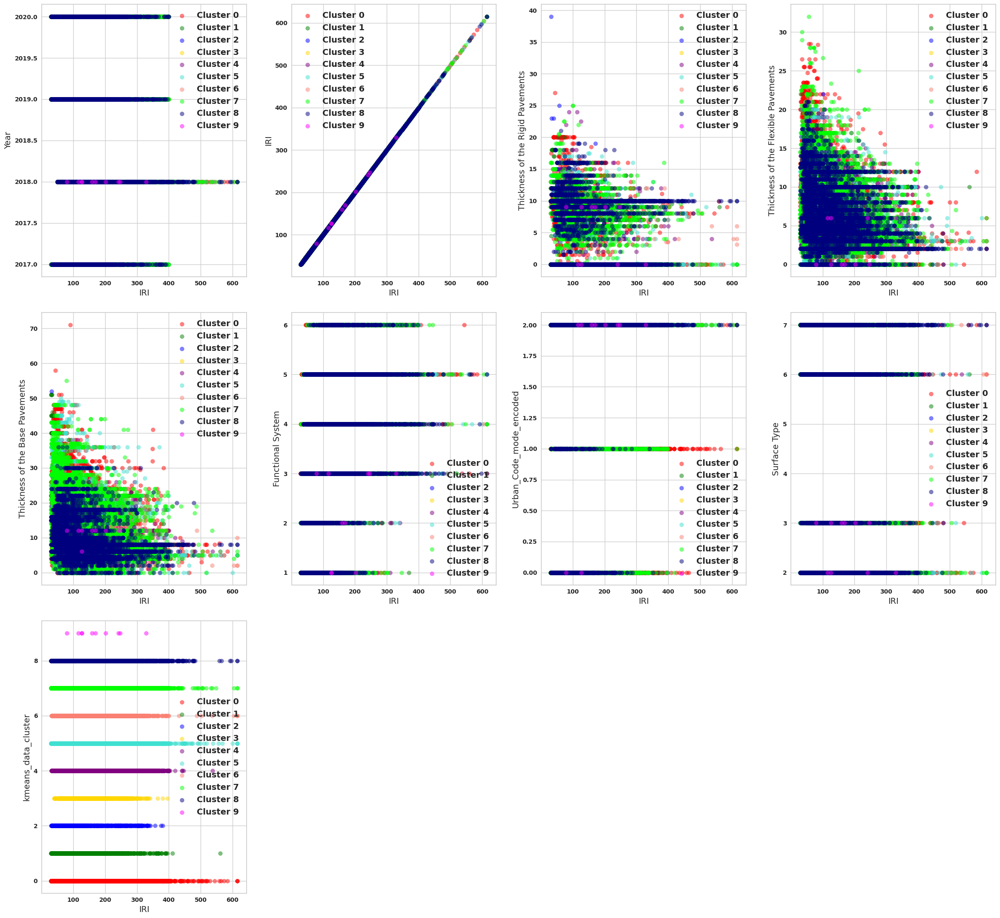

In [69]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ['Year', 'IRI', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System', 'Urban_Code_mode_encoded',
       'Surface Type', 'kmeans_data_cluster']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Consider increasing this if the plots become too crowded
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, n_rows * 8))  # Adjust figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - ensure you have at least 10 colors
colors = ['red', 'green', 'blue', 'gold', 'purple',
    'turquoise', 'salmon', 'lime', 'navy', 'magenta']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(10):  # Adjusted for 10 clusters
        cluster_data = scaled_data[scaled_data['kmeans_data_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    ax.legend(fontsize=14)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI vs Traffic and Climate in Pre-Clusters', fontsize=24, y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of climate  after k-means

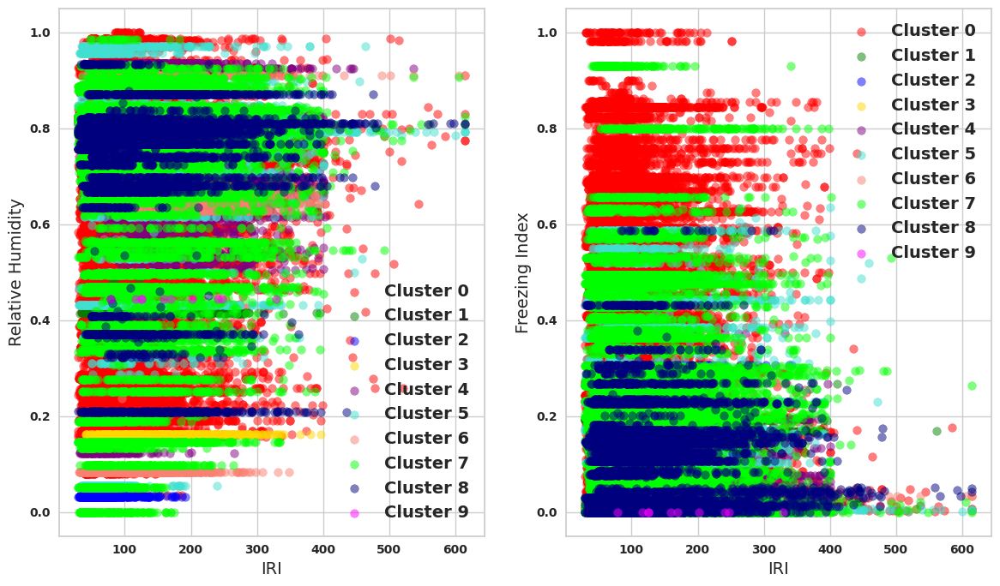

In [70]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ['Relative Humidity', 'Freezing Index']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Consider increasing this if the plots become too crowded
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, n_rows * 8))  # Adjust figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - ensure you have at least 10 colors
colors = ['red', 'green', 'blue', 'gold', 'purple',
    'turquoise', 'salmon', 'lime', 'navy', 'magenta']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(10):  # Adjusted for 10 clusters
        cluster_data = scaled_data[scaled_data['kmeans_data_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    ax.legend(fontsize=14)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI vs Traffic and Climate in Pre-Clusters', fontsize=24, y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Race after k-means

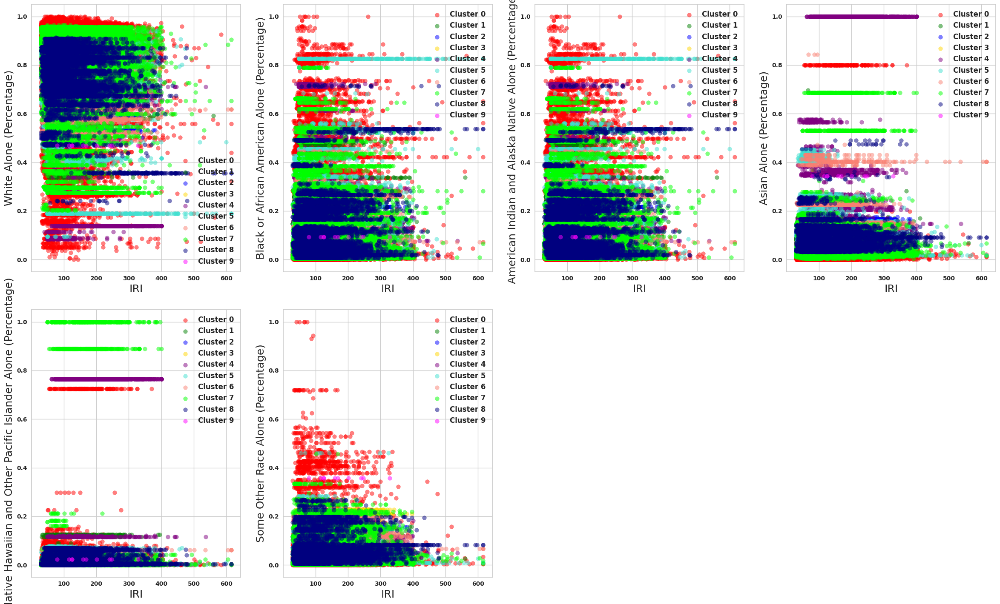

In [71]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = [ 'White Alone (Percentage)',
             'Black or African American Alone (Percentage)',
              'American Indian and Alaska Native Alone (Percentage)',
              'Asian Alone (Percentage)',
              'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
              'Some Other Race Alone (Percentage)']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Consider increasing this if the plots become too crowded
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, n_rows * 8))  # Adjust figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - ensure you have at least 10 colors
colors = ['red', 'green', 'blue', 'gold', 'purple',
    'turquoise', 'salmon', 'lime', 'navy', 'magenta']

# Adjust font sizes
axis_label_font_size = 18  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(10):  # Adjusted for 10 clusters
        cluster_data = scaled_data[scaled_data['kmeans_data_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    ax.legend(fontsize=12)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI vs Race in Pre-Clusters', fontsize=24, y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Income + Age + Employment after k-means

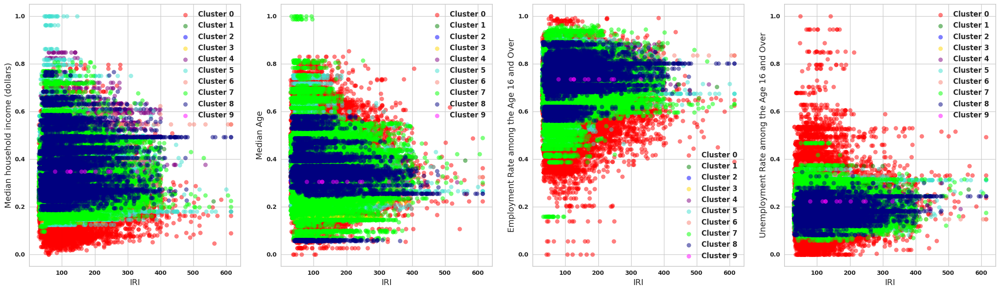

In [72]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = [ 'Median household income (dollars)', 'Median Age', 'Employment Rate among the Age 16 and Over','Unemployment Rate among the Age 16 and Over']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Consider increasing this if the plots become too crowded
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, n_rows * 8))  # Adjust figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - ensure you have at least 10 colors
colors = ['red', 'green', 'blue', 'gold', 'purple',
    'turquoise', 'salmon', 'lime', 'navy', 'magenta']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(10):  # Adjusted for 10 clusters
        cluster_data = scaled_data[scaled_data['kmeans_data_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    ax.legend(fontsize=12)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI vs Income, Age, Employment in Pre-Clusters', fontsize=24, y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()

## Check Clusters of Education after k-means

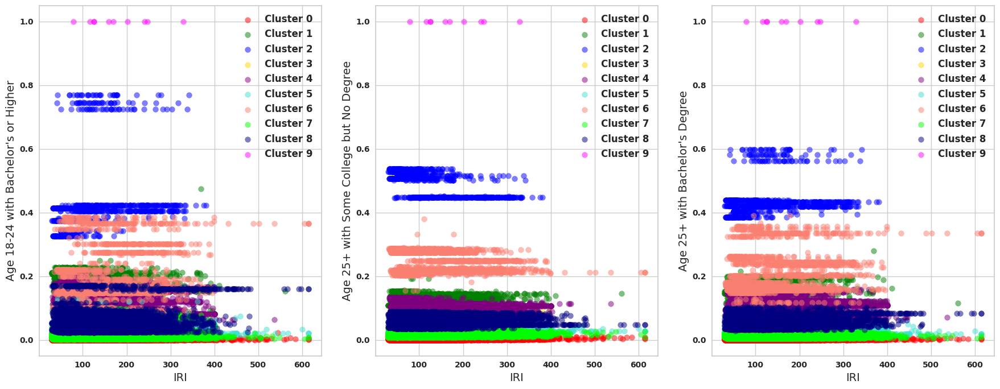

In [73]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ["Age 18-24 with Bachelor's or Higher",
             'Age 25+ with Some College but No Degree',
             "Age 25+ with Bachelor's Degree"]

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Consider increasing this if the plots become too crowded
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, n_rows * 8))  # Adjust figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - ensure you have at least 10 colors
colors = ['red', 'green', 'blue', 'gold', 'purple',
    'turquoise', 'salmon', 'lime', 'navy', 'magenta']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(10):  # Adjusted for 10 clusters
        cluster_data = scaled_data[scaled_data['kmeans_data_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    ax.legend(fontsize=12)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI vs Education in Pre-Clusters', fontsize=24, y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Disability after k-means

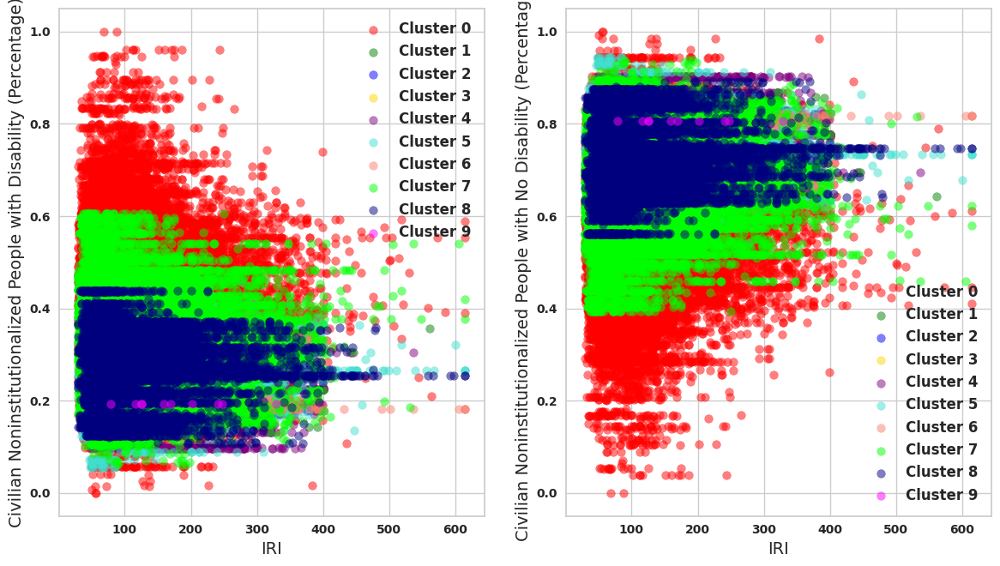

In [74]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ['Civilian Noninstitutionalized People with Disability (Percentage)',
 'Civilian Noninstitutionalized People with No Disability (Percentage)']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Consider increasing this if the plots become too crowded
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, n_rows * 8))  # Adjust figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - ensure you have at least 10 colors
colors = ['red', 'green', 'blue', 'gold', 'purple',
    'turquoise', 'salmon', 'lime', 'navy', 'magenta']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(10):  # Adjusted for 10 clusters
        cluster_data = scaled_data[scaled_data['kmeans_data_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    ax.legend(fontsize=12)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI vs Disability in Pre-Clusters', fontsize=14, y=0.93)
plt.tight_layout(rect=[0, 0.06, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Gender after k-means

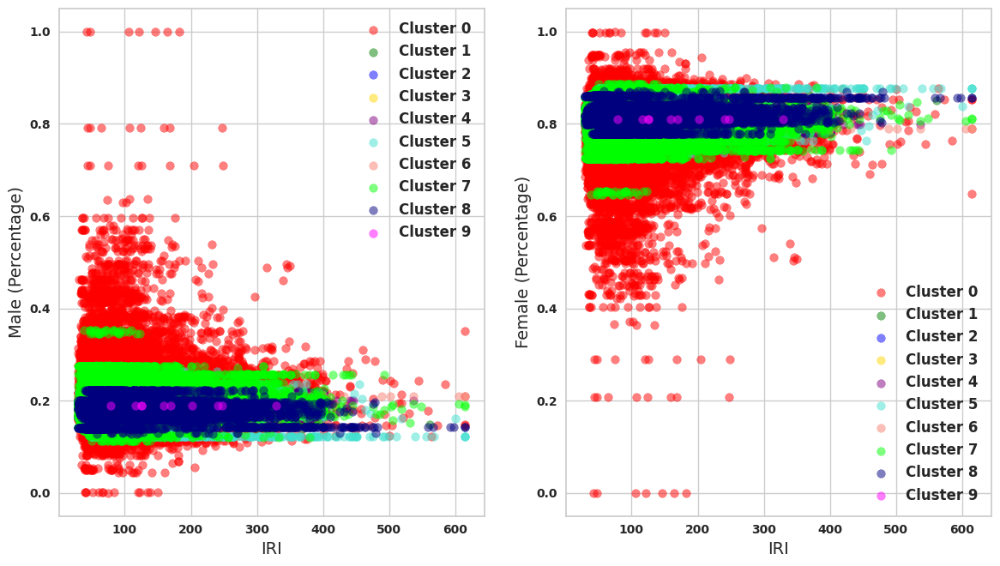

In [75]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ['Male (Percentage)', 'Female (Percentage)']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Consider increasing this if the plots become too crowded
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, n_rows * 8))  # Adjust figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - ensure you have at least 10 colors
colors = ['red', 'green', 'blue', 'gold', 'purple',
    'turquoise', 'salmon', 'lime', 'navy', 'magenta']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(10):  # Adjusted for 10 clusters
        cluster_data = scaled_data[scaled_data['kmeans_data_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    ax.legend(fontsize=12)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI vs Disability in Pre-Clusters', fontsize=14, y=0.93)
plt.tight_layout(rect=[0, 0.06, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Language after k-means

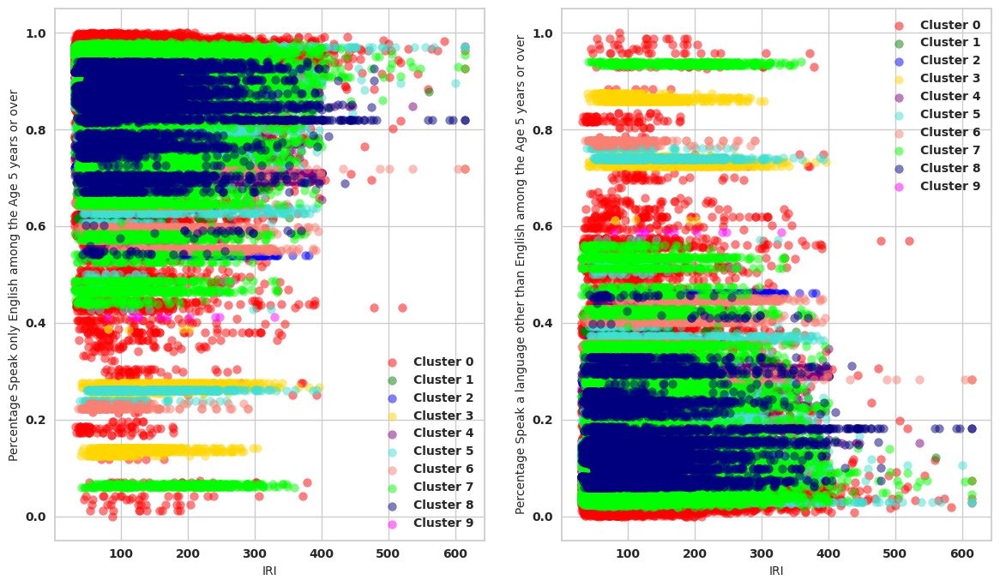

In [76]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = [ 'Percentage Speak only English among the Age 5 years or over',
             'Percentage Speak a language other than English among the Age 5 years or over']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Consider increasing this if the plots become too crowded
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(24, n_rows * 8))  # Adjust figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - ensure you have at least 10 colors
colors = ['red', 'green', 'blue', 'gold', 'purple',
    'turquoise', 'salmon', 'lime', 'navy', 'magenta']

# Adjust font sizes
axis_label_font_size = 10  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(10):  # Adjusted for 10 clusters
        cluster_data = scaled_data[scaled_data['kmeans_data_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    ax.legend(fontsize=10)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI vs Language in Pre-Clusters', fontsize=24, y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check the K-cluster profiles

## k_cluster_1

In [77]:
# Select data for cluster 1
k_cluster_1 = scaled_data[scaled_data['kmeans_data_cluster'] == 0]

k_cluster_1.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [78]:
## Check Unique kmeans
k_cluster_1['kmeans_data_cluster'].unique()

array([0], dtype=int32)

In [79]:
unique_fips_ = k_cluster_1['FIPS_CODE'].unique()
len(unique_fips_)

2067

## k_cluster_2

In [80]:
# Select data for cluster 2
k_cluster_2 = scaled_data[scaled_data['kmeans_data_cluster'] == 1]

k_cluster_2.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [81]:
## Check Unique kmeans
k_cluster_2['kmeans_data_cluster'].unique()

array([1], dtype=int32)

In [82]:
unique_fips_ = k_cluster_2['FIPS_CODE'].unique()
len(unique_fips_)

17

## k_cluster_3

In [83]:
# Select data for cluster 3
k_cluster_3 = scaled_data[scaled_data['kmeans_data_cluster'] == 2]

k_cluster_3.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [84]:
## Check Unique kmeans
k_cluster_3['kmeans_data_cluster'].unique()

array([2], dtype=int32)

In [85]:
unique_fips_ = k_cluster_3['FIPS_CODE'].unique()
len(unique_fips_)

3

## k_cluster_4

In [86]:
# Select data for cluster 4
k_cluster_4 = scaled_data[scaled_data['kmeans_data_cluster'] == 3]

k_cluster_4.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [87]:
## Check Unique kmeans
k_cluster_4['kmeans_data_cluster'].unique()

array([3], dtype=int32)

In [88]:
unique_fips_ = k_cluster_4['FIPS_CODE'].unique()
len(unique_fips_)

3

## k_cluster_5

In [89]:
# Select data for cluster 5
k_cluster_5= scaled_data[scaled_data['kmeans_data_cluster'] == 4]

k_cluster_5.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [90]:
## Check Unique kmeans
k_cluster_5['kmeans_data_cluster'].unique()

array([4], dtype=int32)

In [91]:
unique_fips_ = k_cluster_5['FIPS_CODE'].unique()
len(unique_fips_)

42

## k_cluster_6

In [92]:
# Select data for cluster 6
k_cluster_6= scaled_data[scaled_data['kmeans_data_cluster'] == 5]

k_cluster_6.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [93]:
## Check Unique kmeans
k_cluster_6['kmeans_data_cluster'].unique()

array([5], dtype=int32)

In [94]:
unique_fips_ = k_cluster_6['FIPS_CODE'].unique()
len(unique_fips_)

117

## k_cluster_7

In [95]:
# Select data for cluster 7
k_cluster_7= scaled_data[scaled_data['kmeans_data_cluster'] == 6]

k_cluster_7.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [96]:
## Check Unique kmeans
k_cluster_7['kmeans_data_cluster'].unique()

array([6], dtype=int32)

In [97]:
unique_fips_ = k_cluster_7['FIPS_CODE'].unique()
len(unique_fips_)

14

## k_cluster_8

In [98]:
# Select data for cluster 8
k_cluster_8= scaled_data[scaled_data['kmeans_data_cluster'] == 7]

k_cluster_8.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [99]:
## Check Unique kmeans
k_cluster_8['kmeans_data_cluster'].unique()

array([7], dtype=int32)

In [100]:
unique_fips_ = k_cluster_8['FIPS_CODE'].unique()
len(unique_fips_)

330

## k_cluster_9

In [101]:
# Select data for cluster 9
k_cluster_9= scaled_data[scaled_data['kmeans_data_cluster'] == 8]

k_cluster_9.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [102]:
## Check Unique kmeans
k_cluster_9['kmeans_data_cluster'].unique()

array([8], dtype=int32)

In [103]:
unique_fips_ = k_cluster_9['FIPS_CODE'].unique()
len(unique_fips_)

63

## k_cluster_10

In [104]:
# Select data for cluster 10
k_cluster_10= scaled_data[scaled_data['kmeans_data_cluster'] == 9]

k_cluster_10.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [105]:
## Check Unique kmeans
k_cluster_10['kmeans_data_cluster'].unique()

array([9], dtype=int32)

In [106]:
unique_fips_ = k_cluster_10['FIPS_CODE'].unique()
len(unique_fips_)

1

## Check centroid of the clusters

In [107]:
centroids = kmeans.cluster_centers_
centroids_ = pd.DataFrame(centroids, columns=scaled_data.columns[:36])  # Adjust the index as needed
centroids_.shape

(10, 36)

In [108]:
centroids_

,AADT,IRI,Relative Humidity,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Year,Surface Type,Urban_Code_mode_encoded,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over
0,8908.026399,100.347572,2018.696606,1.687370,6.642479,10.998133,3.177252,94529.665339,0.489637,4.066923,69.694099,3.738424e+02,33614.096973,33614.096973,41.501898,50.182344,49.817656,54.409090,5.708338,66945.239512,84.158972,7.177083,7.177083,0.922644,0.111099,2.037738,3.927630e+04,247.697775,6.012883e+03,3.872512e+03,51293.647440,16.380710,83.619290,3.421377e+04,90.784955,9.215045
1,45059.400977,114.615386,2018.982238,3.219827,5.259597,11.673120,2.894760,53948.669627,1.912966,4.140764,71.752427,2.463441e+02,36491.136767,36491.136767,36.797780,49.000482,50.999518,63.930373,5.323135,90129.129218,69.988262,16.018690,16.018690,4.902086,0.259182,4.431863,1.239073e+06,18338.713144,1.645689e+05,2.130077e+05,64393.104796,11.587342,88.412658,9.519832e+05,79.790739,20.209261
2,45533.317043,126.862658,2018.869674,4.738095,5.270736,11.325776,2.932331,54163.076441,1.619048,4.576441,55.149165,6.676779e+01,22992.526316,22992.526316,35.273058,49.424609,50.575391,61.663910,5.915789,89850.837093,67.534334,13.087412,13.087412,5.658993,0.135759,8.031297,4.408827e+06,46620.073935,6.468479e+05,6.216373e+05,62865.473684,10.336357,89.663643,2.754046e+06,65.255556,34.744444
3,11750.166863,145.427577,2019.170388,0.130082,3.947709,8.462985,4.152761,43913.094007,1.910693,2.653349,54.512299,2.552392e+00,48097.493537,48097.493537,30.664512,49.110893,50.889107,54.853584,6.778496,60804.768508,78.812986,1.886471,1.886471,1.187776,0.076206,11.390831,8.202717e+05,5937.232667,1.023931e+05,7.185002e+04,43639.692127,13.267515,86.732485,1.764784e+05,22.826073,77.173927
4,36793.087428,142.112616,2018.600511,3.071378,6.146166,9.233259,3.251436,57829.553765,1.876835,5.087269,74.342425,1.548803e+02,22995.409381,22995.409381,38.629962,48.874637,51.125363,62.233041,5.630712,105111.163050,62.005167,14.211463,14.211463,11.166921,1.340348,4.162060,8.814227e+05,11780.123963,1.176842e+05,1.442658e+05,76777.851946,11.088387,88.911613,6.509957e+05,76.858332,23.141668
5,24639.875816,115.875768,2018.755337,2.294156,6.005492,11.149483,3.135632,60041.318095,1.640066,4.234417,74.301646,2.312421e+02,33433.547258,33433.547258,39.000611,49.080927,50.919073,59.773320,5.460479,83446.925057,79.331607,11.019135,11.019135,2.895024,0.114948,2.476705,3.172700e+05,3340.491297,4.627546e+04,4.379267e+04,63270.177143,12.901296,87.098704,2.570180e+05,84.484963,15.515037
6,29096.128806,144.288755,2018.827712,1.352080,4.361209,9.309651,3.601641,60076.675934,1.795807,3.256153,59.299248,1.766777e+01,38429.509572,38429.509572,36.094166,49.495124,50.504876,61.422698,5.997083,85989.562899,65.018837,13.387383,13.387383,7.409939,0.390039,7.623877,2.120150e+06,19509.042844,3.181956e+05,2.872081e+05,61942.518687,11.740307,88.259693,1.241744e+06,61.481821,38.518179
7,17114.268607,112.416957,2018.732476,2.282351,6.392927,11.384641,3.155502,66805.273988,1.360911,4.297931

In [109]:
centroids_.iloc[0]

,0
AADT,8908.026399
IRI,100.347572
Relative Humidity,2018.696606
Thickness of the Rigid Pavements,1.687370
Thickness of the Flexible Pavements,6.642479
Thickness of the Base Pavements,10.998133
Functional System,3.177252
Urban_Code_mode,94529.665339
Year,0.489637
Surface Type,4.066923


In [110]:
centroids_.iat[0, 1]  # First row, first column

100.34757232536018

In [111]:
kmeans.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [112]:
# Get the column index of `Mean income Household (dollars)`
centroids_.columns.get_loc('Median household income (dollars)')

30

## Hierarchical clustering

## Linkage method = centroid

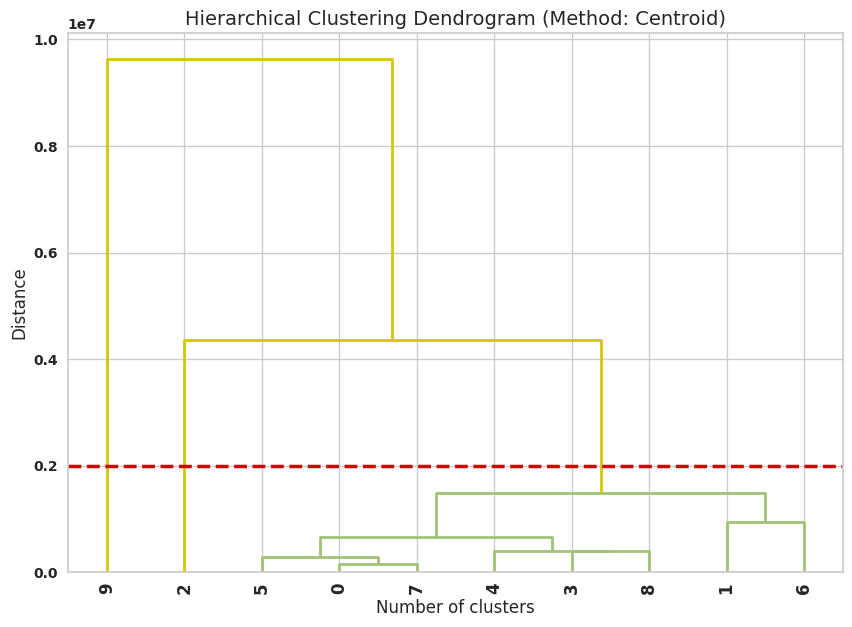

In [113]:
# Your hierarchical clustering code as provided
Z = linkage(centroids_, method='centroid')

# Generating labels for the dendrogram based on centroid indices
labels = centroids_.index.astype(str).tolist()

# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 20  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Adjusting plot size and title
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram (Method: Centroid)', fontsize=14)

# Plot adjustments for clarity and aesthetics
plt.rcParams['lines.linewidth'] = 2  # Increase line width
plt.rcParams['lines.color'] = 'b'    # This won't directly affect dendrogram lines, but useful for other plot lines
plt.rcParams['axes.labelsize'] = 12  # Increase font size for the x and y labels
plt.rcParams['xtick.labelsize'] = 10 # Increase font size for the x-axis tick labels
plt.rcParams['ytick.labelsize'] = 10 # Increase font size for the y-axis tick labels

# Creating the dendrogram with adjustments
dend = dendrogram(Z, labels=labels, above_threshold_color='y', orientation='top', leaf_rotation=90, leaf_font_size=12, color_threshold=2e6)

# Drawing a horizontal line with increased visibility
plt.axhline(y=2e6, color='r', linestyle='--', linewidth=2.5)

# Labels for the plot
plt.xlabel('Number of clusters', fontsize=12)
plt.ylabel('Distance', fontsize=12)

plt.show()


In [114]:
print(dend['color_list'])

['C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'y', 'y']


## Linkage method = average

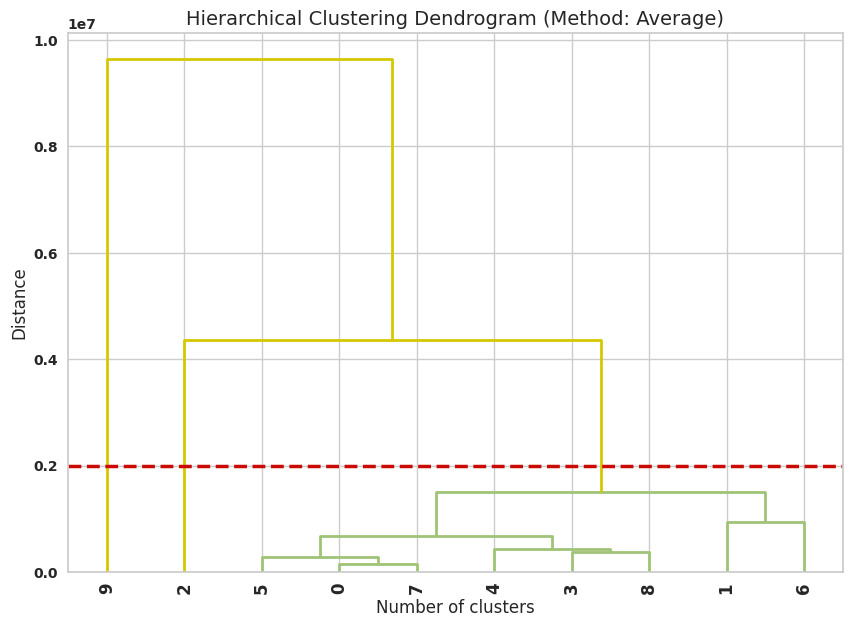

In [115]:
# Your hierarchical clustering code as provided
Z = linkage(centroids_, method='average')

# Generating labels for the dendrogram based on centroid indices
labels = centroids_.index.astype(str).tolist()

# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 20  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Adjusting plot size and title
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram (Method: Average)', fontsize=14)

# Plot adjustments for clarity and aesthetics
plt.rcParams['lines.linewidth'] = 2  # Increase line width
plt.rcParams['lines.color'] = 'b'    # This won't directly affect dendrogram lines, but useful for other plot lines
plt.rcParams['axes.labelsize'] = 12  # Increase font size for the x and y labels
plt.rcParams['xtick.labelsize'] = 10 # Increase font size for the x-axis tick labels
plt.rcParams['ytick.labelsize'] = 10 # Increase font size for the y-axis tick labels

# Creating the dendrogram with adjustments
dend = dendrogram(Z, labels=labels, above_threshold_color='y', orientation='top', leaf_rotation=90, leaf_font_size=12, color_threshold=2e6)

# Drawing a horizontal line with increased visibility
plt.axhline(y=2e6, color='r', linestyle='--', linewidth=2.5)

# Labels for the plot
plt.xlabel('Number of clusters', fontsize=12)
plt.ylabel('Distance', fontsize=12)

plt.show()


In [116]:
print(dend['color_list'])

['C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'C1', 'y', 'y']


## Linkage method = ward

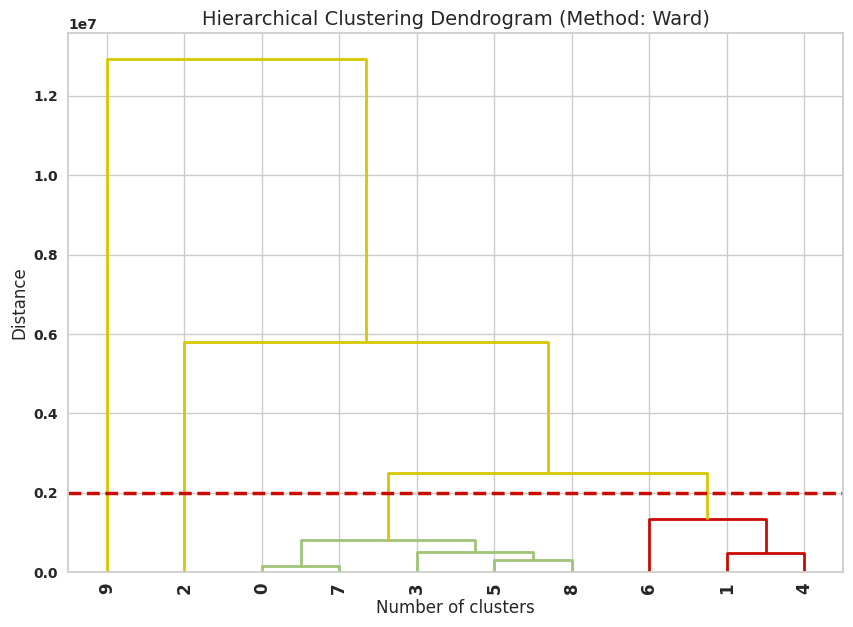

In [117]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Assuming your centroids_ is correctly obtained and centroids_kmeans dataframe is ready
# Your hierarchical clustering code as provided
Z = linkage(centroids_, method='ward')

# Generating labels for the dendrogram based on centroid indices
labels = centroids_.index.astype(str).tolist()

# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 20  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Adjusting plot size and title
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram (Method: Ward)', fontsize=14)

# Plot adjustments for clarity and aesthetics
plt.rcParams['lines.linewidth'] = 2  # Increase line width
plt.rcParams['lines.color'] = 'b'    # This won't directly affect dendrogram lines, but useful for other plot lines
plt.rcParams['axes.labelsize'] = 12  # Increase font size for the x and y labels
plt.rcParams['xtick.labelsize'] = 10 # Increase font size for the x-axis tick labels
plt.rcParams['ytick.labelsize'] = 10 # Increase font size for the y-axis tick labels

# Creating the dendrogram with adjustments
dend = dendrogram(Z, labels=labels, above_threshold_color='y', orientation='top', leaf_rotation=90, leaf_font_size=12, color_threshold=2e6)

# Drawing a horizontal line with increased visibility
plt.axhline(y=2e6, color='r', linestyle='--', linewidth=2.5)

# Labels for the plot
plt.xlabel('Number of clusters', fontsize=12)
plt.ylabel('Distance', fontsize=12)

plt.show()


In [118]:
print(dend['color_list'])

['C1', 'C1', 'C1', 'C1', 'C2', 'C2', 'y', 'y', 'y']


## Method: complete

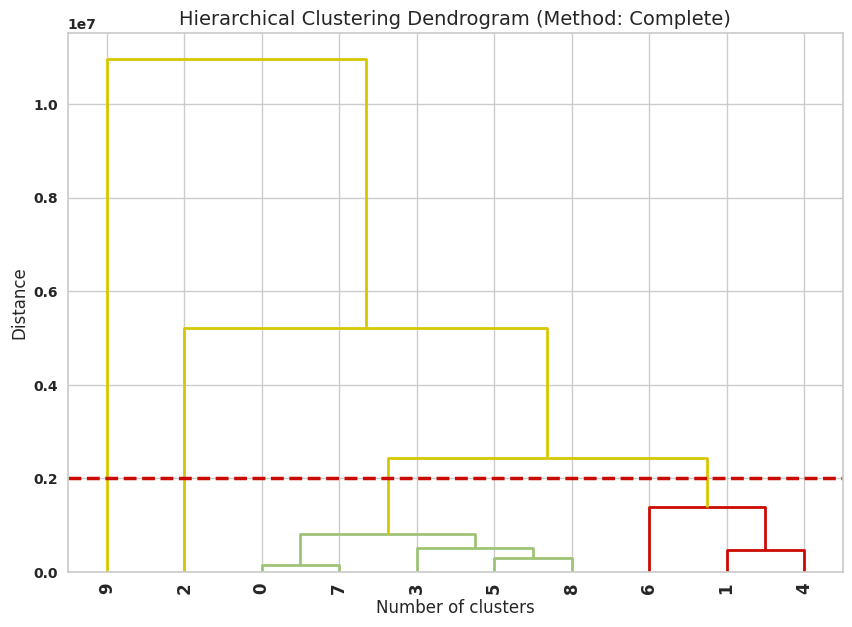

In [119]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Assuming your centroids_ is correctly obtained and centroids_kmeans dataframe is ready
# Your hierarchical clustering code as provided
Z = linkage(centroids_, method='complete')

# Generating labels for the dendrogram based on centroid indices
labels = centroids_.index.astype(str).tolist()

# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 20  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# Adjusting plot size and title
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram (Method: Complete)', fontsize=14)

# Plot adjustments for clarity and aesthetics
plt.rcParams['lines.linewidth'] = 2  # Increase line width
plt.rcParams['lines.color'] = 'b'    # This won't directly affect dendrogram lines, but useful for other plot lines
plt.rcParams['axes.labelsize'] = 12  # Increase font size for the x and y labels
plt.rcParams['xtick.labelsize'] = 10 # Increase font size for the x-axis tick labels
plt.rcParams['ytick.labelsize'] = 10 # Increase font size for the y-axis tick labels

# Creating the dendrogram with adjustments
dend = dendrogram(Z, labels=labels, above_threshold_color='y', orientation='top', leaf_rotation=90, leaf_font_size=12, color_threshold=2e6)

# Drawing a horizontal line with increased visibility
plt.axhline(y=2e6, color='r', linestyle='--', linewidth=2.5)

# Labels for the plot
plt.xlabel('Number of clusters', fontsize=12)
plt.ylabel('Distance', fontsize=12)

plt.show()


In [120]:
## see this to understand the optimal number of clusters: https://www.youtube.com/watch?v=4DInt3H2UNE
## another source: https://www.analyticsvidhya.com/blog/2019/05/beginners-guide-hierarchical-clustering/

print(dend['color_list'])

['C1', 'C1', 'C1', 'C1', 'C2', 'C2', 'y', 'y', 'y']


## Agglomerative CLsutering
source: https://www.kaggle.com/code/heeraldedhia/hierarchical-clustering-for-customer-data

guide: https://www.analyticsvidhya.com/blog/2019/05/beginners-guide-hierarchical-clustering/

## Check silhoutte score

In [121]:
from sklearn.cluster import AgglomerativeClustering

In [122]:
scaled_data.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [123]:
scaled_data.head(10)

,AADT,IRI,Relative Humidity,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Year,Surface Type,Urban_Code_mode_encoded,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over,kmeans_data_cluster
0,0.046059,45.5,0.344571,0.0,11.4,21.8,1,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
1,0.007260,111.5,0.344571,0.0,7.5,7.0,4,99998.0,2017,2,1,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
2,0.001051,106.1,0.344571,0.0,11.9,23.9,4,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
3,0.000871,109.0,0.344571,0.0,9.0,22.5,4,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
4,0.004405,107.4,0.344571,0.0,6.4,20.8,5,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
5,0.006732,67.2,0.344571,0.0,6.2,15.9,3,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
6,0.008783,69.9,0.344571,0.0,4.3,14.3,3,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
7,0.008434,123.2,0.344571,0.0,7.1,15.4,3,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
8,0.052987,33.0,0.344571,0.0,11.2,34.0,1,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0
9,0.051834,32.8,0.344571,0.0,11.0,34.0,1,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0


In [124]:
scaled_data.shape

(105064, 37)

In [125]:
silhouette_scores = []

# Iterate over the desired range of cluster numbers
for n_clusters in range(2, 5):  # 2 to 4 clusters
    # Create an instance of AgglomerativeClustering for the current number of clusters
    hc = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')

    # Fit the model and predict the cluster labels
    y_hc = hc.fit_predict(scaled_data)

    # Calculate the silhouette score for the current clustering
    score = silhouette_score(scaled_data, y_hc)
    score = f"{score:.2f}"  # This will format the score to have two decimal places

    # Print the silhouette score
    print(f"Silhouette Score for {n_clusters} clusters: {score}")

    # Store the score
    silhouette_scores.append(score)

# You can further analyze the silhouette_scores list to find the optimal number of clusters based on your criteria.


Silhouette Score for 2 clusters: 0.50
Silhouette Score for 3 clusters: 0.44
Silhouette Score for 4 clusters: 0.44


## Check Boudlin Score

In [126]:
# Initialize a list to store Davies-Bouldin scores for different numbers of clusters
davies_bouldin_scores = []

# Iterate over the desired range of cluster numbers
for n_clusters in range(2, 5):  # 2 to 4 clusters
    # Create an instance of AgglomerativeClustering for the current number of clusters
    hc = AgglomerativeClustering(n_clusters=n_clusters,  linkage='ward')

    # Fit the model and predict the cluster labels
    y_hc = hc.fit_predict(scaled_data)

    # Calculate the Davies-Bouldin score for the current clustering
    score = davies_bouldin_score(scaled_data, y_hc)
    score = f"{score:.2f}"  # This will format the score to have two decimal places

    # Print the Davies-Bouldin score
    print(f"Davies-Bouldin Score for {n_clusters} clusters: {score}")

    # Store the score
    davies_bouldin_scores.append(score)

Davies-Bouldin Score for 2 clusters: 0.83
Davies-Bouldin Score for 3 clusters: 0.71
Davies-Bouldin Score for 4 clusters: 0.89


## Finally Select the number of clusters in the Final Step

In [127]:
hc = AgglomerativeClustering(n_clusters = 4, linkage ='ward')

y_hc = hc.fit_predict(scaled_data)

In [128]:
hc.feature_names_in_

array(['AADT', 'IRI', 'Relative Humidity',
       'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type',
       'Urban_Code_mode_encoded', 'Freezing Index', 'FIPS_CODE',
       'FIPS_Code', 'Median Age', 'Male (Percentage)',
       'Female (Percentage)', 'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       "Age 18-24 with Bachelor's or Higher",
       'Age 25+ with Some College but No Degree',
       "Age 2

In [129]:
Hierarchical_cluster = pd.DataFrame(y_hc)
Hierarchical_cluster.head(100)

,0
0,1
1,1
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,1


In [130]:
scaled_data.insert(scaled_data.shape[1], 'Hierarchical_cluster', Hierarchical_cluster)

In [131]:
scaled_data.shape

(105064, 38)

In [132]:
save = scaled_data.head(20)
save.to_csv('Final_outputs.csv')

In [133]:
type(data)

pandas.core.frame.DataFrame

In [134]:
data.describe()

,AADT,IRI,Year,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Urban_Code_mode_encoded,Surface Type,Relative Humidity,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over,kmeans_data_cluster
count,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,105064.000000,1.050640e+05,105064.000000,1.050640e+05,1.050640e+05,105064.000000,105064.000000,105064.000000,1.050640e+05,105064.000000,105064.000000,105064.000000
mean,18085.186361,111.754210,2018.722017,2.127918,6.268867,10.837661,3.176140,74964.552530,1.142561,4.196918,71.069917,288.449407,32593.377332,32593.377332,39.876259,49.592044,50.407956,57.533580,5.581059,77024.773467,80.444486,8.877048,8.877048,2.624530,0.240667,2.660053,3.080189e+05,3342.334872,4.426799e+04,4.352751e+04,58295.533603,14.393933,85.606067,2.264644e+05,86.195820,13.804180,3.591306
std,26401.557776,66.748145,1.134708,4.090231,3.623232,6.754839,1.404036,32112.843715,0.917210,2.165741,11.338658,333.777089,14733.834882,14733.834882,5.299852,1.563558,1.563558,6.896756,2.101839,18915.055218,15.694430,12.307777,12.307777,4.732918,1.194995,3.452784,5.382424e+05,6414.937505,7.806195e+04,8.021338e+04,14739.866240,3.678737,3.678737,3.435659e+05,14.346182,14.346182,3.202050
min,2.000000,30.000000,2017.000000,0.000000,0.000000,0.000000,1.000000,199.000000,0.000000,2.000000,30.000000,0.000000,1001.000000,1001.000000,22.200000,41.899580,19.166215,11.000000,0.000000,34501.000000,8.327612,0.000000,0.000000,0.000000,0.000000,0.000000,2.890000e+02,0.000000,2.800000e+01,2.200000e+01,20188.000000,3.806228,64.666667,1.490000e+02,3.636874,0.000000,0.000000
25%,2914.000000,63.600000,2018.000000,0.000000,4.000000,6.000000,2.000000,51364.000000,0.000000,2.000000,68.700000,15.753846,22079.000000,22079.000000,36.600000,48.753065,49.905551,53.300000,4.300000,63902.000000,73.309676,1.050342,1.050342,0.679990,0.011226,0.548350,4.689300e+04,233.000000,7.055000e+03,4.380000e+03,48710.000000,11.800413,83.597214,3.998900e+04,81.951427,4.343570,0.000000
50%,9100.000000,92.000000,2019.000000,0.000000,6.000000,8.000000,3.000000,97831.000000,2.000000,3.000000,75.500000,195.453846,35027.000000,35027.000000,39.900000,49.368313,50.631687,58.400000,5.400000,73646.000000,85.055333,3.745644,3.745644,1.304942,0.037075,1.459219,1.359070e+05,1034.000000,2.015500e+04,1.569400e+04,55377.000000,13.948622,86.051378,1.110590e+05,91.359982,8.640018,5.000000
75%,22114.000000,140.000000,2020.000000,0.000000,8.000000,14.000000,4.000000,99999.000000,2.000000,6.000000,77.416667,393.900000,45015.000000,45015.000000,43.000000,50.094449,51.246935,62.200000,6.500000,85796.000000,92.055239,11.567220,11.567220,2.819511,0.087876,3.259439,3.199510e+05,3494.000000,4.748800e+04,4.370000e+04,65449.000000,16.40278

In [135]:
scaled_data.head(10)

,AADT,IRI,Relative Humidity,Thickness of the Rigid Pavements,Thickness of the Flexible Pavements,Thickness of the Base Pavements,Functional System,Urban_Code_mode,Year,Surface Type,Urban_Code_mode_encoded,Freezing Index,FIPS_CODE,FIPS_Code,Median Age,Male (Percentage),Female (Percentage),Employment Rate among the Age 16 and Over,Unemployment Rate among the Age 16 and Over,Mean income Household (dollars),White Alone (Percentage),Black or African American Alone (Percentage),American Indian and Alaska Native Alone (Percentage),Asian Alone (Percentage),Native Hawaiian and Other Pacific Islander Alone (Percentage),Some Other Race Alone (Percentage),Total civilian noninstitutionalized population,Age 18-24 with Bachelor's or Higher,Age 25+ with Some College but No Degree,Age 25+ with Bachelor's Degree,Median household income (dollars),Civilian Noninstitutionalized People with Disability (Percentage),Civilian Noninstitutionalized People with No Disability (Percentage),Speak only English among the Age 5 years or over,Percentage Speak only English among the Age 5 years or over,Percentage Speak a language other than English among the Age 5 years or over,kmeans_data_cluster,Hierarchical_cluster
0,0.046059,45.5,0.344571,0.0,11.4,21.8,1,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0,1
1,0.007260,111.5,0.344571,0.0,7.5,7.0,4,99998.0,2017,2,1,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0,1
2,0.001051,106.1,0.344571,0.0,11.9,23.9,4,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0,1
3,0.000871,109.0,0.344571,0.0,9.0,22.5,4,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0,1
4,0.004405,107.4,0.344571,0.0,6.4,20.8,5,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0,1
5,0.006732,67.2,0.344571,0.0,6.2,15.9,3,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0,1
6,0.008783,69.9,0.344571,0.0,4.3,14.3,3,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0,1
7,0.008434,123.2,0.344571,0.0,7.1,15.4,3,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0,1
8,0.052987,33.0,0.344571,0.0,11.2,34.0,1,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.566198,0,1
9,0.051834,32.8,0.344571,0.0,11.0,34.0,1,99999.0,2017,2,0,0.063286,4001,4001.0,0.262009,0.192056,0.807944,0.343844,0.463816,0.064307,0.157699,0.005816,0.005816,0.008148,0.006845,0.011998,0.007025,0.000472,0.009011,0.002342,0.095901,0.341835,0.658165,0.007317,0.433802,0.5

## Sort the Scaled_data_final

## Check Clusters of Traffic + Pavement  after Hierarhical

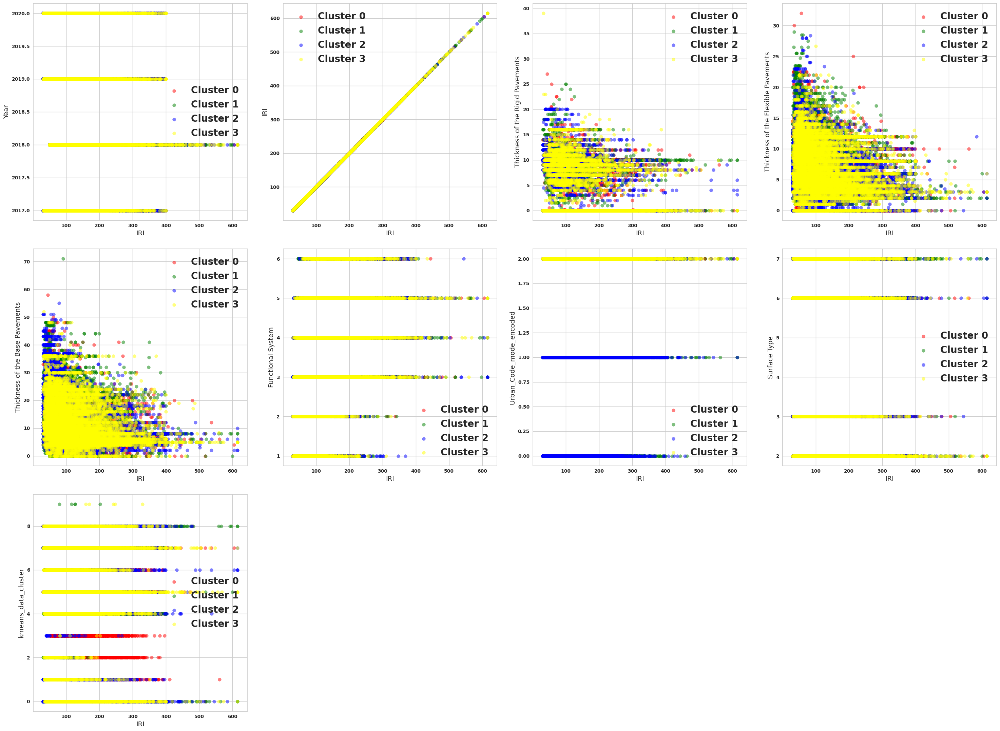

In [136]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster', 'Hierarchical_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ['Year', 'IRI', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System', 'Urban_Code_mode_encoded',
       'Surface Type', 'kmeans_data_cluster']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Fixed number of columns
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, n_rows * 8))  # Adjusted figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - assuming up to 6 clusters for now, add more colors if you have more clusters
colors = ['red', 'green', 'blue', 'yellow', 'purple', 'orange']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(4):  # Adjust range as per the number of clusters you have
        cluster_data = scaled_data[scaled_data['Hierarchical_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    # ax.set_title(f'IRI_mean vs {y_column}', fontsize=title_font_size)
    ax.legend(fontsize=20)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI_mean vs Traffic, Climate, and Social Features in Final Clusters', fontsize=30,  y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Climate  after Hierarhical

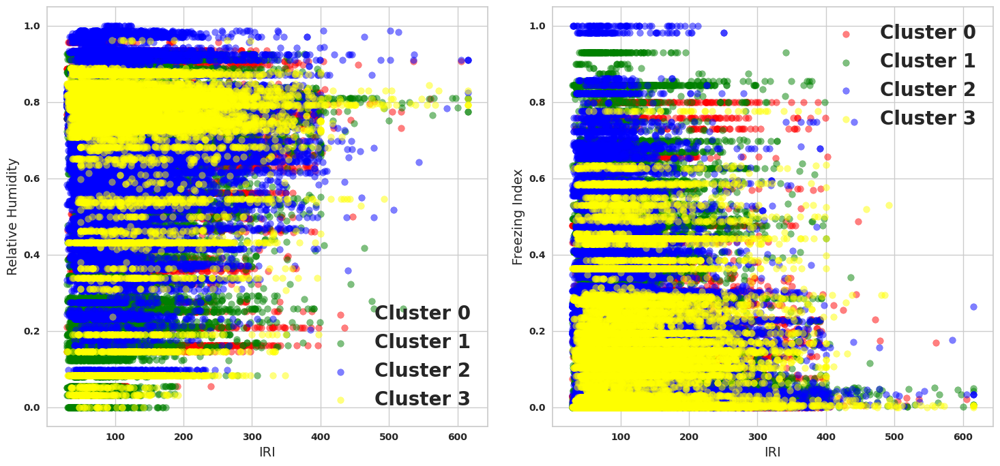

In [137]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster', 'Hierarchical_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ['Relative Humidity', 'Freezing Index' ]

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Fixed number of columns
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, n_rows * 8))  # Adjusted figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - assuming up to 6 clusters for now, add more colors if you have more clusters
colors = ['red', 'green', 'blue', 'yellow', 'purple', 'orange']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(4):  # Adjust range as per the number of clusters you have
        cluster_data = scaled_data[scaled_data['Hierarchical_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    # ax.set_title(f'IRI_mean vs {y_column}', fontsize=title_font_size)
    ax.legend(fontsize=20)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI_mean vs Traffic, Climate, and Social Features in Final Clusters', fontsize=30,  y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Income + Age + Employment

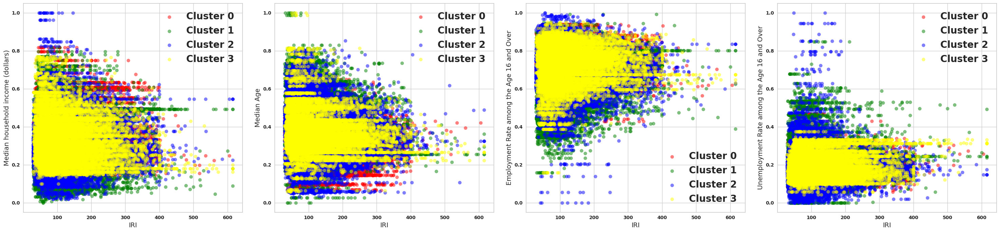

In [138]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster', 'Hierarchical_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = [ 'Median household income (dollars)', 'Median Age', 'Employment Rate among the Age 16 and Over','Unemployment Rate among the Age 16 and Over']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Fixed number of columns
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, n_rows * 8))  # Adjusted figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - assuming up to 6 clusters for now, add more colors if you have more clusters
colors = ['red', 'green', 'blue', 'yellow', 'purple', 'orange']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(4):  # Adjust range as per the number of clusters you have
        cluster_data = scaled_data[scaled_data['Hierarchical_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    # ax.set_title(f'IRI_mean vs {y_column}', fontsize=title_font_size)
    ax.legend(fontsize=20)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI_mean vs Traffic, Climate, and Social Features in Final Clusters', fontsize=30,  y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Race after Hierarhical

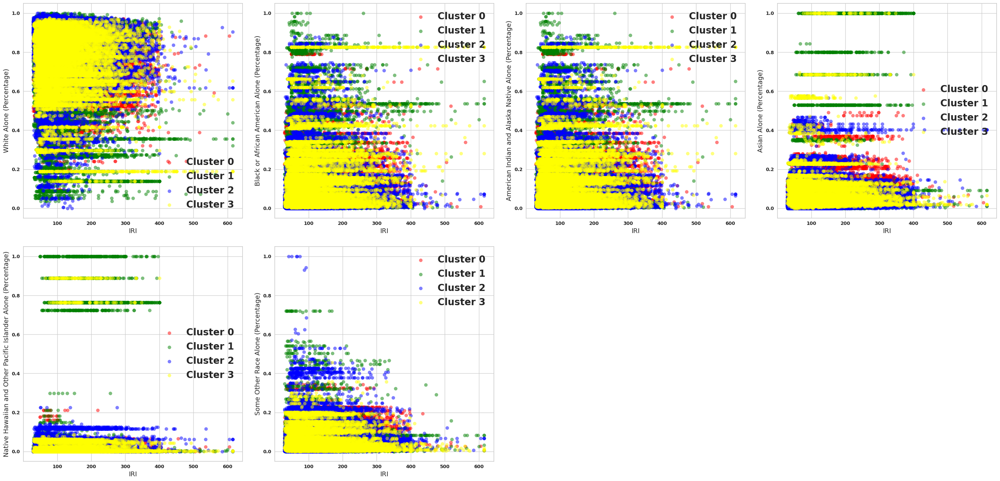

In [139]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster', 'Hierarchical_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ['White Alone (Percentage)',
             'Black or African American Alone (Percentage)',
              'American Indian and Alaska Native Alone (Percentage)',
              'Asian Alone (Percentage)',
              'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
              'Some Other Race Alone (Percentage)']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Fixed number of columns
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, n_rows * 8))  # Adjusted figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - assuming up to 6 clusters for now, add more colors if you have more clusters
colors = ['red', 'green', 'blue', 'yellow', 'purple', 'orange']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(4):  # Adjust range as per the number of clusters you have
        cluster_data = scaled_data[scaled_data['Hierarchical_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    # ax.set_title(f'IRI_mean vs {y_column}', fontsize=title_font_size)
    ax.legend(fontsize=20)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI_mean vs Traffic, Climate, and Social Features in Final Clusters', fontsize=30,  y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Education after Hierarhical

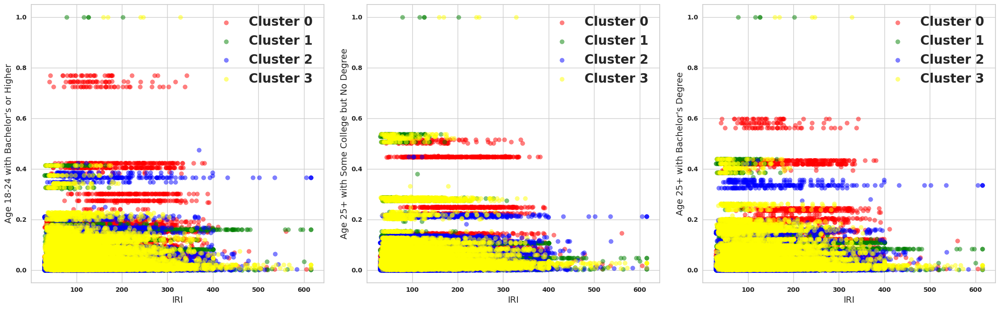

In [140]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster', 'Hierarchical_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ["Age 18-24 with Bachelor's or Higher",
             'Age 25+ with Some College but No Degree',
             "Age 25+ with Bachelor's Degree"]

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Fixed number of columns
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, n_rows * 8))  # Adjusted figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - assuming up to 6 clusters for now, add more colors if you have more clusters
colors = ['red', 'green', 'blue', 'yellow', 'purple', 'orange']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(4):  # Adjust range as per the number of clusters you have
        cluster_data = scaled_data[scaled_data['Hierarchical_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    # ax.set_title(f'IRI_mean vs {y_column}', fontsize=title_font_size)
    ax.legend(fontsize=20)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI_mean vs Traffic, Climate, and Social Features in Final Clusters', fontsize=30,  y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Disability after Hierarhical

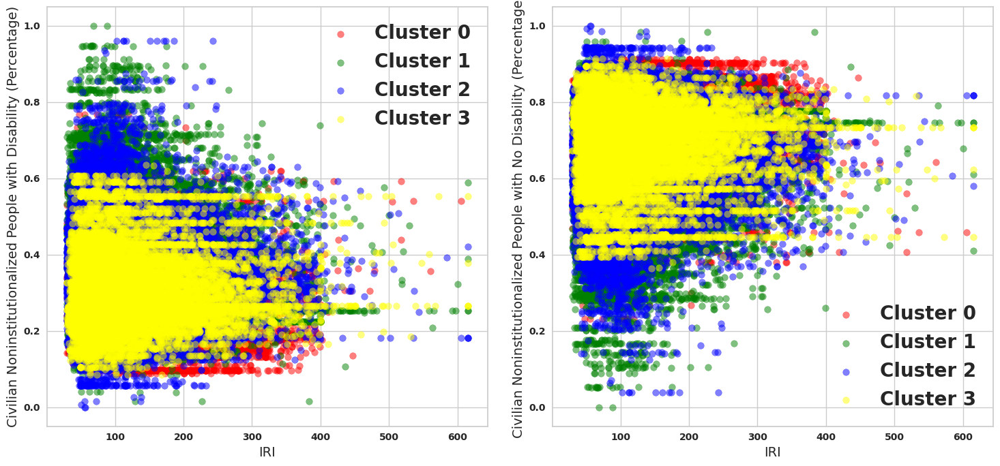

In [141]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster', 'Hierarchical_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ['Civilian Noninstitutionalized People with Disability (Percentage)','Civilian Noninstitutionalized People with No Disability (Percentage)']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Fixed number of columns
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, n_rows * 8))  # Adjusted figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - assuming up to 6 clusters for now, add more colors if you have more clusters
colors = ['red', 'green', 'blue', 'yellow', 'purple', 'orange']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(4):  # Adjust range as per the number of clusters you have
        cluster_data = scaled_data[scaled_data['Hierarchical_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    # ax.set_title(f'IRI_mean vs {y_column}', fontsize=title_font_size)
    ax.legend(fontsize=20)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI_mean vs Traffic, Climate, and Social Features in Final Clusters', fontsize=30,  y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Gender after Hierarhical

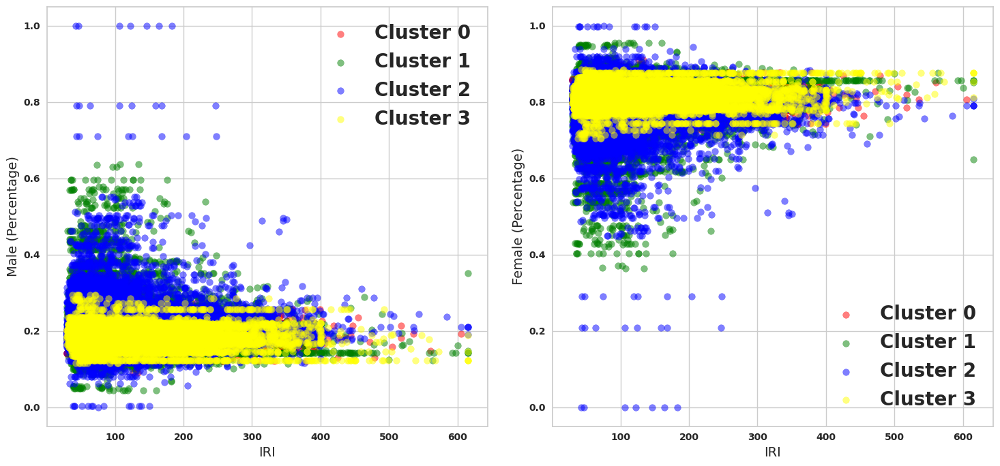

In [142]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster', 'Hierarchical_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ['Male (Percentage)', 'Female (Percentage)']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Fixed number of columns
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, n_rows * 8))  # Adjusted figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - assuming up to 6 clusters for now, add more colors if you have more clusters
colors = ['red', 'green', 'blue', 'yellow', 'purple', 'orange']

# Adjust font sizes
axis_label_font_size = 14  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(4):  # Adjust range as per the number of clusters you have
        cluster_data = scaled_data[scaled_data['Hierarchical_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    # ax.set_title(f'IRI_mean vs {y_column}', fontsize=title_font_size)
    ax.legend(fontsize=20)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI_mean vs Traffic, Climate, and Social Features in Final Clusters', fontsize=30,  y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check Clusters of Language after Hierarhical

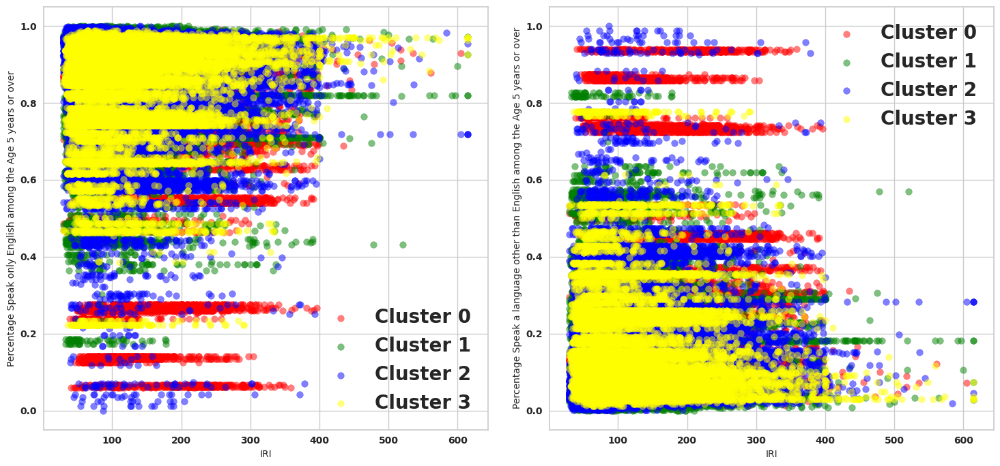

In [143]:
# Setting font globally to Times New Roman, increasing default font size, and making the font bold
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = 'Times New Roman'
plt.rcParams['font.size'] = 24  # Increasing the base font size
plt.rcParams['font.weight'] = 'bold'  # Making the font bold

# List of columns to exclude from the plots (e.g., non-numerical or not relevant for comparison)
exclude_columns = ['Year', 'IRI', 'kmeans_data_cluster', 'Hierarchical_cluster']

# Ensure only numerical columns are considered for Y-axis
y_columns = ['Percentage Speak only English among the Age 5 years or over', 'Percentage Speak a language other than English among the Age 5 years or over']

# Number of Y columns
n_plots = len(y_columns)

# Calculate number of rows and columns for subplots dynamically
n_cols = 4  # Fixed number of columns
n_rows = (n_plots + n_cols - 1) // n_cols  # Dynamically calculate rows needed

# Adjusting figure size here (width, height in inches)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(30, n_rows * 8))  # Adjusted figure size based on dynamic calculation
axs = axs.flatten()  # Flatten to 1D array for easy indexing

# Define colors for clusters - assuming up to 6 clusters for now, add more colors if you have more clusters
colors = ['red', 'green', 'blue', 'yellow', 'purple', 'orange']

# Adjust font sizes
axis_label_font_size = 10  # Adjust font size for axis labels
title_font_size = 30  # Adjust font size for titles

# Loop through all Y columns to plot
for i, y_column in enumerate(y_columns):
    ax = axs[i]  # Access subplot axis by index
    for cluster_id in range(4):  # Adjust range as per the number of clusters you have
        cluster_data = scaled_data[scaled_data['Hierarchical_cluster'] == cluster_id]
        if not cluster_data.empty:  # Check if there's data for the cluster
            ax.scatter(cluster_data['IRI'], cluster_data[y_column], alpha=0.5, color=colors[cluster_id % len(colors)], label=f'Cluster {cluster_id}')
    ax.set_xlabel('IRI', fontsize=axis_label_font_size)
    ax.set_ylabel(y_column, fontsize=axis_label_font_size)
    # ax.set_title(f'IRI_mean vs {y_column}', fontsize=title_font_size)
    ax.legend(fontsize=20)

# Hide any unused subplots if the number of plots is not exactly divisible by n_cols
for j in range(i+1, n_rows*n_cols):
    axs[j].set_visible(False)

# plt.suptitle('IRI_mean vs Traffic, Climate, and Social Features in Final Clusters', fontsize=30,  y=0.93)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


## Check H-cluster Profile 1

In [144]:
# Select data for cluster 1
Hierarchical_cluster_1 = scaled_data[scaled_data['Hierarchical_cluster'] == 0]

Hierarchical_cluster_1.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [145]:
## Check Unique kmeans
Hierarchical_cluster_1['kmeans_data_cluster'].unique()

array([7, 2, 5, 0, 4, 8, 1, 6, 3], dtype=int32)

In [146]:
unique_fips_ = Hierarchical_cluster_1['FIPS_CODE'].unique()
len(unique_fips_)

364

In [147]:
Hierarchical_cluster_1.shape

(21190, 38)

In [148]:
Hierarchical_cluster_1.to_csv('/content/drive/MyDrive/HMPS-Socioeconomic_dataset/Second_submission /Journal of Engineering Management /Response_to_reviewers/Re-Data-interpolation-analysis/Cluster_Analysis/Final_Clusters/hcluster_1_review.csv')

## Check H-cluster 2

In [149]:
# Select data for cluster 2
Hierarchical_cluster_2 = scaled_data[scaled_data['Hierarchical_cluster'] == 1]

Hierarchical_cluster_2.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [150]:
## Check Unique kmeans
Hierarchical_cluster_2['kmeans_data_cluster'].unique()

array([0, 7, 2, 4, 5, 8, 1, 6, 9], dtype=int32)

In [151]:
unique_fips_ = Hierarchical_cluster_2['FIPS_CODE'].unique()
len(unique_fips_)

1478

In [152]:
Hierarchical_cluster_2.shape

(32169, 38)

In [153]:
Hierarchical_cluster_2.to_csv('/content/drive/MyDrive/HMPS-Socioeconomic_dataset/Second_submission /Journal of Engineering Management /Response_to_reviewers/Re-Data-interpolation-analysis/Cluster_Analysis/Final_Clusters/hcluster_2_review.csv')

## Check H-cluster 3

In [154]:
# Select data for cluster 1
Hierarchical_cluster_3 = scaled_data[scaled_data['Hierarchical_cluster'] == 2]

Hierarchical_cluster_3.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [155]:
## Check Unique kmeans
Hierarchical_cluster_3['kmeans_data_cluster'].unique()

array([5, 8, 0, 7, 4, 1, 6, 3, 2], dtype=int32)

In [156]:
unique_fips_ = Hierarchical_cluster_3['FIPS_CODE'].unique()
len(unique_fips_)

1044

In [157]:
Hierarchical_cluster_3.shape

(36469, 38)

In [158]:
Hierarchical_cluster_3.to_csv('/content/drive/MyDrive/HMPS-Socioeconomic_dataset/Second_submission /Journal of Engineering Management /Response_to_reviewers/Re-Data-interpolation-analysis/Cluster_Analysis/Final_Clusters/hcluster_3_review.csv')

## Check H-cluster 4

In [159]:
# Select data for cluster 1
Hierarchical_cluster_4 = scaled_data[scaled_data['Hierarchical_cluster'] == 3]

Hierarchical_cluster_4.columns

Index(['AADT', 'IRI', 'Relative Humidity', 'Thickness of the Rigid Pavements',
       'Thickness of the Flexible Pavements',
       'Thickness of the Base Pavements', 'Functional System',
       'Urban_Code_mode', 'Year', 'Surface Type', 'Urban_Code_mode_encoded',
       'Freezing Index', 'FIPS_CODE', 'FIPS_Code', 'Median Age',
       'Male (Percentage)', 'Female (Percentage)',
       'Employment Rate among the Age 16 and Over',
       'Unemployment Rate among the Age 16 and Over',
       'Mean income Household (dollars)', 'White Alone (Percentage)',
       'Black or African American Alone (Percentage)',
       'American Indian and Alaska Native Alone (Percentage)',
       'Asian Alone (Percentage)',
       'Native Hawaiian and Other Pacific Islander Alone (Percentage)',
       'Some Other Race Alone (Percentage)',
       'Total civilian noninstitutionalized population',
       'Age 18-24 with Bachelor's or Higher',
       'Age 25+ with Some College but No Degree',
       'Age 25+ with

In [160]:
## Check Unique kmeans
Hierarchical_cluster_4['kmeans_data_cluster'].unique()

unique_fips_ = Hierarchical_cluster_4['FIPS_CODE'].unique()
len(unique_fips_)

268

In [161]:
Hierarchical_cluster_4.shape

(15236, 38)

In [162]:
Hierarchical_cluster_4.to_csv('/content/drive/MyDrive/HMPS-Socioeconomic_dataset/Second_submission /Journal of Engineering Management /Response_to_reviewers/Re-Data-interpolation-analysis/Cluster_Analysis/Final_Clusters//hcluster_4_review.csv')

## print the count of urbanity and rurality after Hierarchical